In [1]:
# Mount google drive for import
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Loading


In [2]:
# Import training data
import h5py
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf


# path = '/content/drive/MyDrive/Colab Notebooks/kuzikus_data_f32.hdf5'
#path = '/content/drive/MyDrive/Colab Notebooks/kuzikus_data.hdf5' # for heavy data
path = '/content/drive/MyDrive/Colab Notebooks/kuzikus_data_f32.hdf5'


In [3]:
# Get hdf5 file object
f = h5py.File(path, "r")
print(f.keys())

<KeysViewHDF5 ['label_data', 'train_data']>


In [4]:
# Check shape of data
print(f['label_data'].shape)
print(f['train_data'].shape)

(1024, 64, 64, 1, 6)
(1024, 64, 64, 24, 6)


In [5]:
# Check datatype
f['train_data'][0,0,0,0,0].dtype, f['label_data'][0,0,0,0,0].dtype

(dtype('float32'), dtype('float32'))

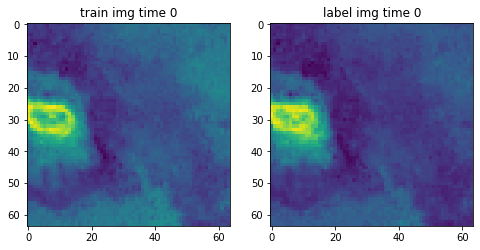

In [6]:
# Sample image
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(f['train_data'][0,:,:,0,0])
ax1.set_title('train img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(f['label_data'][0,:,:,0,0])
ax2.set_title('label img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['train_data'][0,:,:,1,0])
# ax2.set_title('train img time -1')

plt.show()

In [7]:
# Convert to tensors and make train, validation, test split for data
n = f['train_data'].shape[0]
train_set = tf.constant(f['train_data'][0:int(n*0.7)])
val_set = tf.constant(f['train_data'][int(n*0.7):int(n*0.9)])
test_set = tf.constant(f['train_data'][int(n*0.9):])

n = f['label_data'].shape[0]
label_train_set = tf.constant(f['label_data'][0:int(n*0.7)])
label_val_set = tf.constant(f['label_data'][int(n*0.7):int(n*0.9)])
label_test_set = tf.constant(f['label_data'][int(n*0.9):])

print(train_set.shape)
print(val_set.shape)
print(test_set.shape)

(716, 64, 64, 24, 6)
(205, 64, 64, 24, 6)
(103, 64, 64, 24, 6)


In [8]:
print(label_train_set.shape)
print(label_val_set.shape)
print(label_test_set.shape)

(716, 64, 64, 1, 6)
(205, 64, 64, 1, 6)
(103, 64, 64, 1, 6)


# Time series visualization

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]


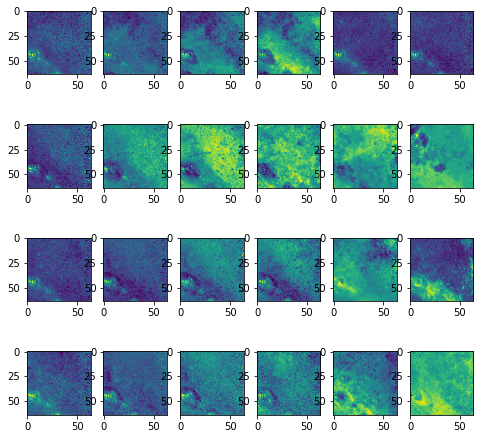

In [10]:

fig = plt.figure(figsize=(8, 8))
columns = 6
rows = 4
what2 = np.arange(0, columns*rows)
print(what2)
for i in what2:
    
    img = val_set[1,:,:,i,4]
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img)
    
plt.show()

# Required packages for all models

In [11]:
#Importing necessary packages for neural network
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.layers import PReLU
!pip install keras-tuner -q
import keras_tuner as kt

     |████████████████████████████████| 97 kB 3.7 MB/s 


In [12]:
pip install keras_sequential_ascii


  Created wheel for keras-sequential-ascii: filename=keras_sequential_ascii-0.1.1-py3-none-any.whl size=3062 sha256=0caeef0d510cb46b79a77741e0cde2479d7894c13e8bb35e9f8e80ae67e16c86
  Stored in directory: /root/.cache/pip/wheels/4e/99/75/8910ced4b40e8c20088c237fa706b32ac758321482ae2659e3
Successfully built keras-sequential-ascii


# Mean Function for CNN and convlstm

In [13]:
def time_mean(tensor):
  tensor = tf.reduce_mean(tensor, axis = 3)
  tensor = tf.expand_dims(tensor, axis = 3)
  # tensor = tf.reduce_mean(tensor, axis = 1)   # for convlstm
  # tensor = tf.expand_dims(tensor, axis = 1)
  return tensor

# Skip CNN


In [14]:
# Sample prediction model
inputs = keras.Input(shape=(64,64,24,6), name="input time series channels")
#mean = time_mean(inputs)
print(tf.keras.backend.is_keras_tensor(inputs))
inputs_shape = K.int_shape(inputs)
print(inputs_shape[0])
print(inputs_shape)
mean_input = K.mean(inputs, axis=3,  keepdims=True)
print(mean_input.shape)
#mean_input = K.reshape(mean_input, [819,64,64,1,6])  # not required
print(mean_input.shape)
x = layers.Conv3D(32, 3, activation="PReLU",padding='same')(inputs)
x = layers.MaxPooling3D(pool_size=2,strides=2)(x)
x = layers.Conv3D(64, 3, activation="PReLU")(x)
x = layers.MaxPooling3D(pool_size=2,strides=2)(x)
x = layers.Conv3D(128, 3, activation="PReLU")(x)
x = layers.MaxPooling3D(pool_size=2,strides=2)(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(5000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((64, 64, 1, 6))(x)
output = layers.add([x, mean_input])
#output = layers.add([x, mean])
model = keras.Model(inputs, output, name="SkipCNN")
model.summary()

True
None
(None, 64, 64, 24, 6)
(None, 64, 64, 1, 6)
(None, 64, 64, 1, 6)
Model: "SkipCNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 64, 64, 24,  0                                            
__________________________________________________________________________________________________
conv3d (Conv3D)                 (None, 64, 64, 24, 3 3150944     input time series channels[0][0] 
__________________________________________________________________________________________________
max_pooling3d (MaxPooling3D)    (None, 32, 32, 12, 3 0           conv3d[0][0]                     
__________________________________________________________________________________________________
conv3d_1 (Conv3D)               (None, 30, 30, 10, 6 631360      max_pooling3d[0][0]              
__________________

# Skip CNN Model Exp

In [ ]:
# Sample prediction model
inputs = keras.Input(shape=(64,64,24,6), name="input time series channels")
#mean = time_mean(inputs)
print(tf.keras.backend.is_keras_tensor(inputs))
inputs_shape = K.int_shape(inputs)
print(inputs_shape[0])
print(inputs_shape)
mean_input = K.mean(inputs, axis=3,  keepdims=True)
print(mean_input.shape)
x = layers.Conv3D(32, 3, activation="PReLU",padding='same')(inputs)
x = layers.MaxPooling3D(pool_size=2,strides=2 ,padding='same')(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
#x = layers.Dense(5000, activation="PReLU")(x)
#x = layers.Dropout(0.5)(x)
x = layers.Dense(7000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((64, 64, 1, 6))(x)
x_1 = layers.add([x, mean_input])
x = layers.Conv3D(64, 3, activation="PReLU",padding='same')(x_1)
x = layers.MaxPooling3D(pool_size=2,strides=2)(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((64, 64, 1, 6))(x)
x_2 = layers.add([x, x_1])
x = layers.Conv3D(128, 3, activation="PReLU",padding='same')(x_2)
x = layers.MaxPooling3D(pool_size=2,strides=2)(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((64, 64, 1, 6))(x)
x_3 = layers.add([x, x_2])
x = layers.Flatten()(x_3)
x = layers.Dropout(0.5)(x)
x = layers.Dense(3000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(5000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
output = layers.Reshape((64, 64, 1, 6))(x)
#output = layers.add([x, mean_input])
#output = layers.add([x, mean])
model = keras.Model(inputs, output, name="SkipCNN")
model.summary()

True
None
(None, 64, 64, 24, 6)
(None, 64, 64, 1, 6)
(None, 64, 64, 1, 6)
Model: "SkipCNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 64, 64, 24,  0                                            
__________________________________________________________________________________________________
conv3d_13 (Conv3D)              (None, 64, 64, 24, 6 590802      input time series channels[0][0] 
__________________________________________________________________________________________________
tf.math.reduce_mean_18 (TFOpLam (None, 64, 64, 1, 6) 0           conv3d_13[0][0]                  
__________________________________________________________________________________________________
tf.math.reduce_mean_17 (TFOpLam (None, 64, 64, 1, 6) 0           input time series channels[0][0] 
__________________

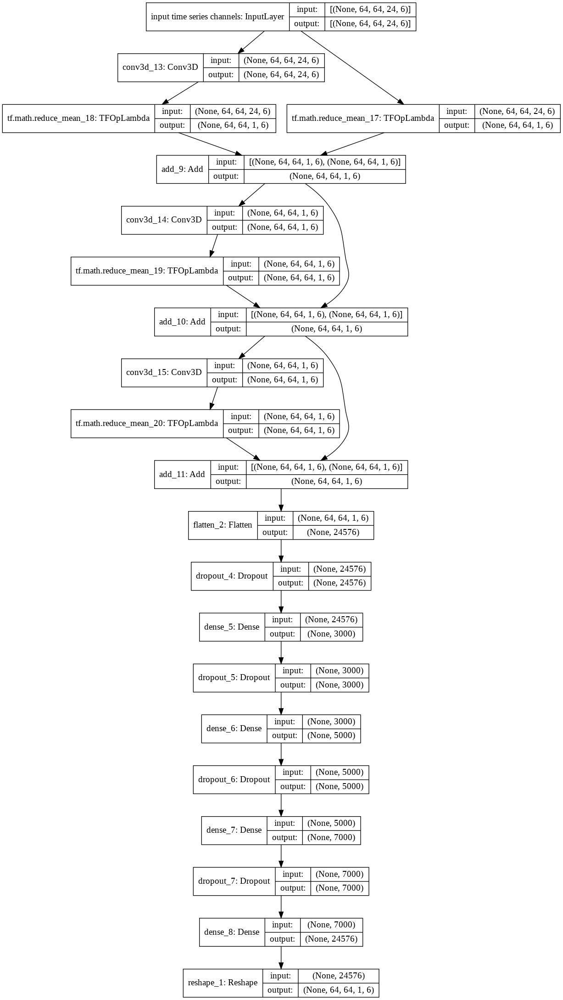

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
# Model Complilation 
model.compile(tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
    name='Adam'), loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
train_loss_acc = model.fit(train_set, label_train_set, epochs=5, validation_data=(val_set, label_val_set))

Epoch 1/5
23/23 [==============================] - 41s 383ms/step - loss: 1.0393 - root_mean_squared_error: 1.0195 - val_loss: 0.9744 - val_root_mean_squared_error: 0.9871
Epoch 2/5
23/23 [==============================] - 8s 335ms/step - loss: 1.0048 - root_mean_squared_error: 1.0024 - val_loss: 0.9730 - val_root_mean_squared_error: 0.9864
Epoch 3/5
23/23 [==============================] - 8s 337ms/step - loss: 1.0037 - root_mean_squared_error: 1.0019 - val_loss: 0.9693 - val_root_mean_squared_error: 0.9845
Epoch 4/5
23/23 [==============================] - 8s 334ms/step - loss: 0.9957 - root_mean_squared_error: 0.9978 - val_loss: 0.9650 - val_root_mean_squared_error: 0.9823
Epoch 5/5
23/23 [==============================] - 8s 334ms/step - loss: 1.0003 - root_mean_squared_error: 1.0002 - val_loss: 0.9649 - val_root_mean_squared_error: 0.9823


In [ ]:
# Checking the keys of the dictionary generated after training
print(train_loss_acc.history.keys())

dict_keys(['loss', 'root_mean_squared_error', 'val_loss', 'val_root_mean_squared_error'])


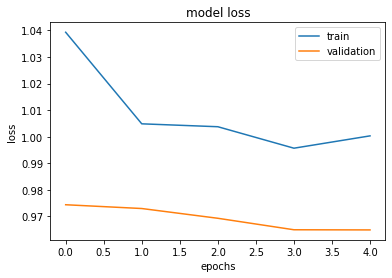

In [ ]:
# summarize history for loss
plt.plot(train_loss_acc.history['loss'])
plt.plot(train_loss_acc.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

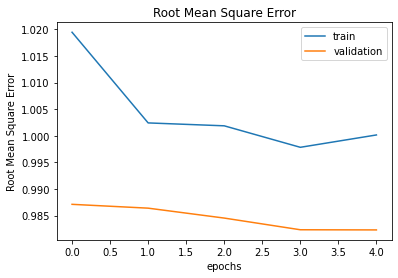

In [ ]:
# summarize history for our choosen metric
plt.plot(train_loss_acc.history['root_mean_squared_error'])
plt.plot(train_loss_acc.history['val_root_mean_squared_error'])
plt.title('Root Mean Square Error')
plt.ylabel('Root Mean Square Error')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
# Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

# Skip ConvLSTM model

In [ ]:
# Moving axis in our initial data to bring time axis infront to work with convLSTMs
train_set = np.moveaxis(train_set,3,1)
print(train_set.shape)
label_train_set = np.moveaxis(label_train_set,3,1)
print(label_train_set.shape)
val_set = np.moveaxis(val_set,3,1)
print(val_set.shape)
label_val_set = np.moveaxis(label_val_set,3,1)
print(label_val_set.shape)

(716, 24, 64, 64, 6)
(716, 1, 64, 64, 6)
(205, 24, 64, 64, 6)
(205, 1, 64, 64, 6)


In [ ]:
# Initialize weights using gaussian
def gauss(x, sigma):
    return 1 / (np.sqrt(2 * np.pi) * sigma) * np.exp(-x**2 / (2 * sigma**2))
x = np.array([-3,-2,-1,0,1,2])
y = gauss(x, sigma=0.9)
weights = np.concatenate((y,y,y,y),axis=0)

In [ ]:
def time_WeightedMean(tensor):
  mean_tensor = tf.zeros_like(tensor[:,1,:,:,:], dtype='float32')
  for i in range(24):
    w_tensor = tf.ones_like(tensor[:,i,:,:,:], dtype='float32')*weights[i]
    mean_tensor = mean_tensor + tensor[:,i,:,:,:]*w_tensor

  mean_tensor = mean_tensor/(weights.sum())
  mean_tensor = tf.expand_dims(mean_tensor, axis = 1)
  return mean_tensor

In [ ]:
def custom_loss(y_true,y_pred):
  
    N = 1/(16*64*64*6)    # Normalization factor based on image dimensions (16,1,64,64,6)
    l1_loss = N*tf.reduce_sum(tf.abs(tf.math.subtract(y_true,y_pred)))
    l2_loss = N*tf.reduce_sum(tf.math.squared_difference(y_true,y_pred))
    ssim_loss = (1-tf.reduce_mean(tf.image.ssim(y_true,y_pred,max_val=37)))
    
    total_loss= 0.5*ssim_loss + 0.3*l1_loss + 0.2*l2_loss     # weighted sum of different losses
     
    return total_loss

In [ ]:
model_7.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss=custom_loss)
history = model_7.fit(train_set, label_train_set, validation_data=(val_set,label_val_set), epochs=10, batch_size=16, verbose=2)

In [ ]:
# Construct the input layer (Frame_size,img_height, img_width, #channels)
inp = layers.Input(shape=(24,64,64,6))
#mean = time_mean(inp)
mean_input = Lambda(time_WeightedMean)(inp)
# print(tf.keras.backend.is_keras_tensor(inp))
# inputs_shape = K.int_shape(inp)
# print(inputs_shape[0])
# print(inputs_shape)
# mean_input = K.mean(inp, axis=1,  keepdims=True)
# print(mean_input.shape)
# 3 `ConvLSTM2D` layers with batch normalization,
# followed by a `Conv3D` layer which will covert the input volume to groundtruth shape
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(6, 6),
    padding="same",
    return_sequences=True,
    activation="PReLU",
)(inp)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="PReLU",
)(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(
    filters=48,
    kernel_size=(1, 1),
    padding="same",
    return_sequences=True,
    activation="PReLU",
)(x)
x = layers.Conv3D(
    filters=6, kernel_size=(24, 1, 1), activation="PReLU", padding="valid"
)(x)
output = layers.add([x, mean_input])
# output = layers.add([x, mean])
# Next, we will build the complete model and compile it.
model = keras.models.Model(inp, output)
# need to decide on loss error function
model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001), loss=custom_loss)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 24, 64, 64,  0                                            
__________________________________________________________________________________________________
conv_lst_m2d_3 (ConvLSTM2D)     (None, 24, 64, 64, 1 116288      input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_2 (BatchNor (None, 24, 64, 64, 1 64          conv_lst_m2d_3[0][0]             
__________________________________________________________________________________________________
conv_lst_m2d_4 (ConvLSTM2D)     (None, 24, 64, 64, 3 186496      batch_normalization_2[0][0]      
____________________________________________________________________________________________

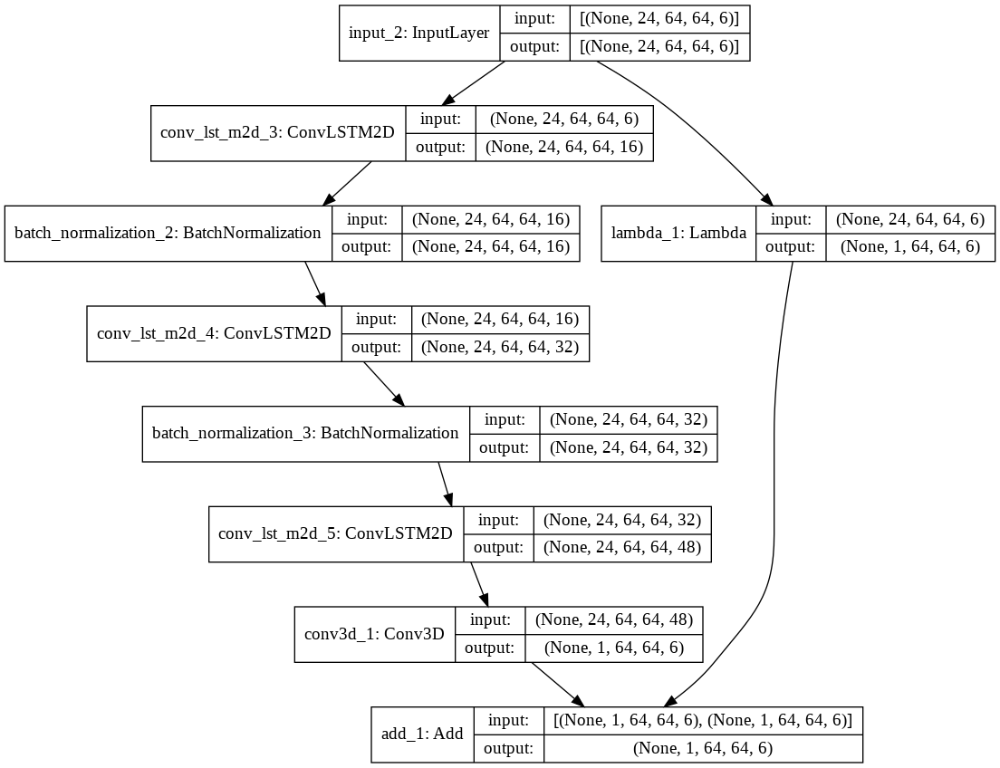

In [ ]:
# Model Graph
keras.utils.plot_model(model, "ConvLSTM.png", show_shapes=True)

In [ ]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 10
batch_size = 10

# Fit the model to the training data.
train_loss_acc = model.fit(
    train_set,
    label_train_set,
    batch_size=batch_size,
    epochs=epochs,
    verbose=2,
    validation_data=(val_set, label_val_set),
    callbacks=[early_stopping, reduce_lr])

Epoch 1/10
72/72 - 77s - loss: 0.5310 - val_loss: 0.5155
Epoch 2/10
72/72 - 63s - loss: 0.5118 - val_loss: 0.5132
Epoch 3/10
72/72 - 63s - loss: 0.5036 - val_loss: 0.5095
Epoch 4/10
72/72 - 61s - loss: 0.4977 - val_loss: 0.5035
Epoch 5/10
72/72 - 62s - loss: 0.4953 - val_loss: 0.4956
Epoch 6/10
72/72 - 63s - loss: 0.4911 - val_loss: 0.4889
Epoch 7/10
72/72 - 64s - loss: 0.4895 - val_loss: 0.4831
Epoch 8/10
72/72 - 63s - loss: 0.4859 - val_loss: 0.4777
Epoch 9/10
72/72 - 63s - loss: 0.4810 - val_loss: 0.4719
Epoch 10/10
72/72 - 62s - loss: 0.4766 - val_loss: 0.4669


In [ ]:
# Checking the keys of the dictionary generated after training
print(train_loss_acc.history.keys())

dict_keys(['loss', 'val_loss', 'lr'])


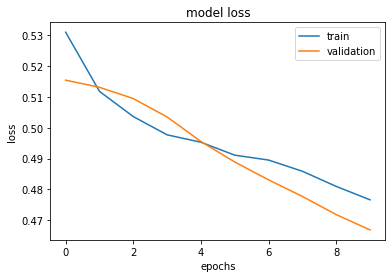

In [ ]:
# summarize history for loss
plt.plot(train_loss_acc.history['loss'])
plt.plot(train_loss_acc.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
# summarize history for our choosen metric
plt.plot(train_loss_acc.history['root_mean_squared_error'])
plt.plot(train_loss_acc.history['val_root_mean_squared_error'])
plt.title('Root Mean Square Error')
plt.ylabel('Root Mean Square Error')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
# Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

# ConvLSTM

In [ ]:
#Construction of ConvLSTM
# Construct the input layer (Frame_size,img_height, img_width, #channels)
inp = layers.Input(shape=(24,64,64,6))

# 3 `ConvLSTM2D` layers with batch normalization,
# followed by a `Conv3D` layer which will covert the input volume to groundtruth shape
x = layers.ConvLSTM2D(
    filters=16,
    kernel_size=(6, 6),
    padding="same",
    return_sequences=True,
    activation="PReLU",
)(inp)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="PReLU",
)(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(
    filters=64,
    kernel_size=(1, 1),
    padding="same",
    return_sequences=True,
    activation="PReLU",
)(x)
x = layers.Conv3D(
    filters=6, kernel_size=(24, 1, 1), activation="PReLU", padding="valid"
)(x)

# Next, we will build the complete model and compile it.
model = keras.models.Model(inp, x)
# need to decide on loss error function
model.compile(
    loss='mse', optimizer=keras.optimizers.Adam(),
)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 24, 64, 64, 6)]   0         
_________________________________________________________________
conv_lst_m2d (ConvLSTM2D)    (None, 24, 64, 64, 16)    116288    
_________________________________________________________________
batch_normalization (BatchNo (None, 24, 64, 64, 16)    64        
_________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)  (None, 24, 64, 64, 32)    186496    
_________________________________________________________________
batch_normalization_1 (Batch (None, 24, 64, 64, 32)    128       
_________________________________________________________________
conv_lst_m2d_2 (ConvLSTM2D)  (None, 24, 64, 64, 64)    286976    
_________________________________________________________________
conv3d (Conv3D)              (None, 1, 64, 64, 6)      33798 

In [ ]:
from keras_sequential_ascii import keras2ascii
keras2ascii(model)


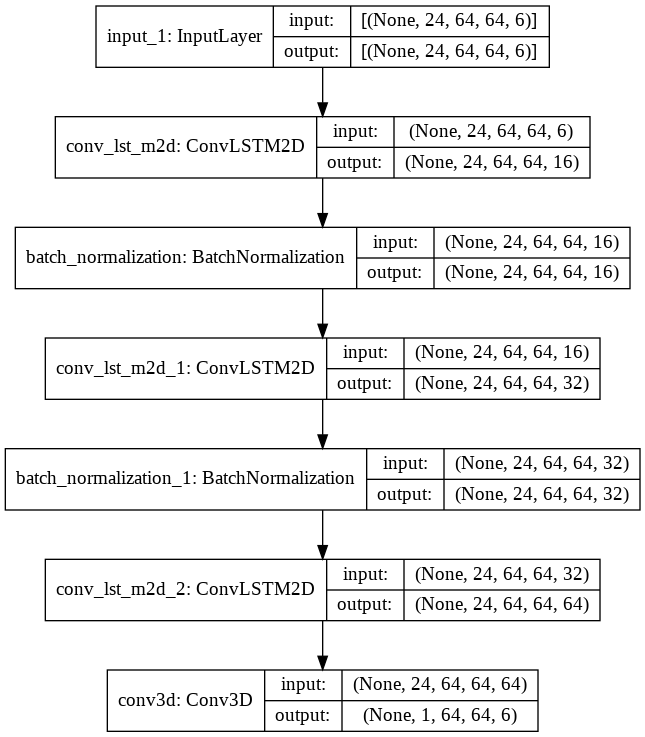

In [ ]:
keras.utils.plot_model(model, "ConvLSTM.png", show_shapes=True)

In [ ]:
# Define some callbacks to improve training and training the model
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 10
batch_size = 10

# Fit the model to the training data.
model.fit(
    train_set,
    label_train_set,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(val_set, label_val_set),
    callbacks=[early_stopping, reduce_lr])

Epoch 1/10
72/72 [==============================] - 76s 923ms/step - loss: 0.9979 - val_loss: 1.0270
Epoch 2/10
72/72 [==============================] - 63s 871ms/step - loss: 0.9894 - val_loss: 1.0282
Epoch 3/10
72/72 [==============================] - 63s 879ms/step - loss: 0.9893 - val_loss: 1.0270
Epoch 4/10
72/72 [==============================] - 63s 881ms/step - loss: 0.9895 - val_loss: 1.0269
Epoch 5/10
72/72 [==============================] - 64s 887ms/step - loss: 0.9892 - val_loss: 1.0269
Epoch 6/10
72/72 [==============================] - 64s 885ms/step - loss: 0.9888 - val_loss: 1.0269
Epoch 7/10
72/72 [==============================] - 63s 881ms/step - loss: 0.9892 - val_loss: 1.0269
Epoch 8/10
72/72 [==============================] - 63s 882ms/step - loss: 0.9887 - val_loss: 1.0269
Epoch 9/10
72/72 [==============================] - 62s 858ms/step - loss: 0.9892 - val_loss: 1.0269
Epoch 10/10
72/72 [==============================] - 63s 870ms/step - loss: 0.9888 - val_lo

In [ ]:
 # Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

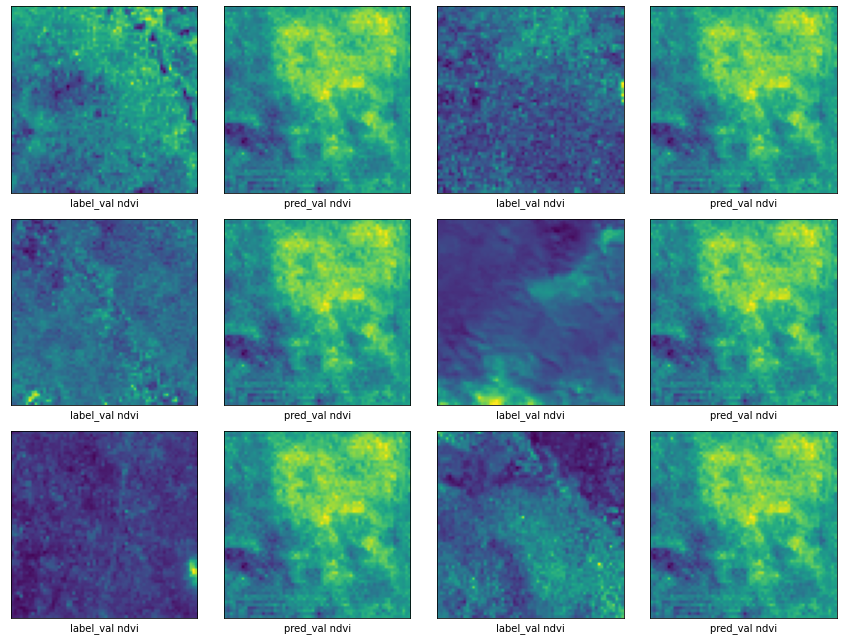

In [ ]:
# visualize the result for NDVI for validation set
plt.figure(figsize = (12, 9))
for i in range(1, 7):
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[i,0,:,:,3])
    plt.xlabel("label_val ndvi")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[i,0,:,:,3])
    plt.xlabel("pred_val ndvi")
plt.tight_layout();

In [ ]:
# Calculating Mean L1 loss between the actual and the predicted labels for NDVI for convLSTM
l1_error = []
for q in range(label_val_set.shape[0]):
  squared_diff_image = tf.math.abs(label_val_set[q,0,:,:,3] - label_hat_val[q,0,:,:,3])  
  l1_error.append(squared_diff_image) # for l1 error

print(l1_error)
mean_l1_error = []
for a in range(label_val_set.shape[0]):
  avg_image = np.mean(l1_error[a])
  mean_l1_error.append(avg_image)

print(len(mean_l1_error))
print(mean_l1_error)

[<tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.6979431 , 0.54985076, 0.44216418, ..., 0.81112576, 0.83810574,
        0.90285695],
       [0.25731897, 0.24811797, 0.34919408, ..., 0.8873525 , 0.9279448 ,
        0.9027244 ],
       [0.23441856, 0.49719998, 0.35762748, ..., 0.8707169 , 1.0538597 ,
        0.96927416],
       ...,
       [0.8421937 , 0.81654406, 0.58367264, ..., 0.85674477, 0.8570596 ,
        0.78206193],
       [0.82237387, 0.9601281 , 0.89069307, ..., 0.8767725 , 0.8232497 ,
        0.8004805 ],
       [0.74756956, 0.9235766 , 0.86080015, ..., 0.7892798 , 0.7730615 ,
        0.8101951 ]], dtype=float32)>, <tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.68824184, 0.94210774, 1.0404844 , ..., 1.022443  , 1.0983152 ,
        0.878279  ],
       [0.9256987 , 0.885323  , 0.5741234 , ..., 0.79740804, 0.85742784,
        0.6734643 ],
       [0.85286087, 0.74685377, 0.86733437, ..., 1.0175382 , 1.11374   ,
        0.81026727],
       ...,
       [1.1

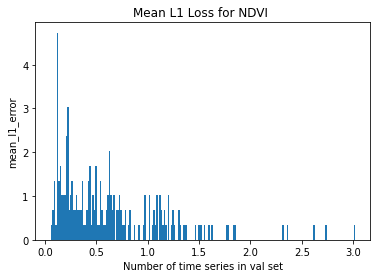

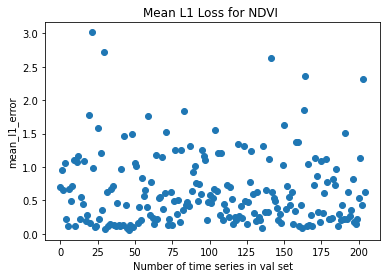

In [ ]:
# Ploting the Mean L1 loss for convLSTM
plt.hist(mean_l1_error, density=True, bins=205)  # density=False would make counts
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for NDVI ')
plt.show()

plt.plot(mean_l1_error,'o')
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for NDVI ')
plt.show()

In [ ]:
df = pd.DataFrame(mean_l1_error, columns=['mean_l1_error'])
df.describe()

,mean_l1_error
count,205.000000
mean,0.640295
std,0.534219
min,0.057250
25%,0.220682
50%,0.492154
75%,0.961106
max,3.016749


In [ ]:
print(df.loc[df['mean_l1_error']<0.4].count())

mean_l1_error    83
dtype: int64


In [ ]:
# Calculating SSIM loss between the actual and the predicted labels for NDVI for convLSTM
ssim_loss = []
what = np.arange(205)
for q in what:
  img1 = label_val_set[q,0,:,:,3]
  print(img1.shape)
  img2 = label_hat_val[q,0,:,:,3]
  print(img2.shape)
  exp_true = tf.expand_dims(img1, axis = 0)
  exp_pred = tf.expand_dims(img2, axis = 0)
  exp_true_32 = tf.image.convert_image_dtype(exp_true, tf.float32)
  exp_pred_32 = tf.image.convert_image_dtype(exp_pred, tf.float32)
  ssim = tf.image.ssim(exp_true_32, exp_pred_32, filter_size=1, max_val = 47)
  ssim_loss.append(ssim)

print(ssim_loss)


(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(64, 64)
(

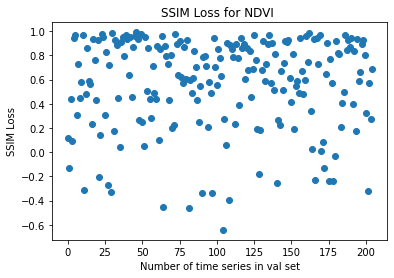

In [ ]:
# Ploting the SSIM Loss for Skip CNN

plt.plot(ssim_loss,'o')
plt.ylabel('SSIM Loss')
plt.xlabel('Number of time series in val set')
plt.title('SSIM Loss for NDVI ')
plt.show()

In [ ]:
df = pd.DataFrame(ssim_loss, columns=['ssim_summary'])
df.describe()

,ssim_summary
count,205.000000
mean,0.566871
std,0.380536
min,-0.643086
25%,0.342293
50%,0.674081
75%,0.889849
max,0.991670


In [ ]:
print(df.loc[df['ssim_summary']>0.8].count())
print(df.loc[(df['ssim_summary']>0.4) & (df['ssim_summary']<0.8)].count())

ssim_summary    74
dtype: int64
ssim_summary    78
dtype: int64


# Keras tuner for the hyper parameter tuning 

In [ ]:
# Model-building function OR HyperModel subclass
#Building a function for a model(model for which hyper parameter needs to be tuned) in this case skip CNN model
def build_model(hp):
  inputs = keras.Input(shape=(64,64,24,6), name="input time series channels")
  #mean = time_mean(inputs)
  print(tf.keras.backend.is_keras_tensor(inputs))
  inputs_shape = K.int_shape(inputs)
  print(inputs_shape[0])
  print(inputs_shape)
  mean_input = K.mean(inputs, axis=3,  keepdims=True)
  #mean_input = Lambda(time_WeightedMean)(inputs)
  print(mean_input.shape)
  for i in range(hp.Int("conv_layers", 3, 5, default=3)):
    filters = hp.Int("filters_" + str(i), 32, 160, step=32)
    kernel = hp.Int("kerel_" + str(i), 3, 9, step=2)
    if i == 0:
      x = layers.Conv3D(filters, kernel_size=kernel, activation='elu', padding="same")(inputs)
      x = layers.BatchNormalization()(x)
      #x = layers.PReLU()(x)
      if hp.Choice("pooling_" + str(i), ["avg", "max"]) == "avg":
        x = layers.AveragePooling3D(pool_size=2,strides=2,padding='same')(x)
      else:
        x = layers.MaxPooling3D(pool_size=2,strides=2,padding='same')(x)
    else:
      x = layers.Conv3D(filters, kernel_size=kernel, activation='elu',padding="same")(x)
      x = layers.BatchNormalization()(x)
      #x = layers.PReLU()(x)
      if hp.Choice("pooling_" + str(i), ["avg", "max"]) == "avg":
        x = layers.AveragePooling3D(pool_size=2,strides=2,padding='same')(x)
      else:
        x = layers.MaxPooling3D(pool_size=2,strides=2,padding='same')(x)
  #x = tf.keras.layers.GlobalAvgPool2D()(x)
  x = layers.Flatten()(x)
  x = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(x)
  x = layers.Dense(hp.Int("hidden_size", 100, 200, step=10, default=3000), activation="elu")(x)
  x = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(x)
  x = layers.Dense(hp.Int("hidden_size", 500, 1000, step=100, default=5000), activation="elu")(x)
  x = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(x)
  x = layers.Dense(hp.Int("hidden_size", 1000, 3000, step=500, default=3000), activation="elu")(x)
  x = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(x)
  x = layers.Dense(24576, activation="linear")(x)
  x = layers.Reshape((64, 64, 1, 6))(x)
  output = layers.add([x, mean_input])
  model = keras.Model(inputs, output, name="SkipCNN")

  model.compile(
            optimizer=tf.keras.optimizers.Adam(
                hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")), loss="mse", metrics=[tf.keras.metrics.RootMeanSquaredError()],)
  return model

In [ ]:
#Instantiate the tuner to be used [RandomSearch, Hyperband, or BayesianOptimization]
tuner = kt.BayesianOptimization(
        build_model,
        #objective = 'mse',
        #objective = 'root_mean_squared_error',
        objective = kt.Objective("root_mean_squared_error", direction="min"),
        max_trials = 20,
        seed=None,
        hyperparameters=None,
        tune_new_entries=True,
        allow_new_entries=True,
    )

INFO:tensorflow:Reloading Oracle from existing project ./untitled_project/oracle.json
True
None
(None, 64, 64, 24, 6)
(None, 64, 64, 1, 6)
INFO:tensorflow:Reloading Tuner from ./untitled_project/tuner0.json


In [ ]:
#Run tuning using tuner.search()
tuner.search(train_set, label_train_set, epochs=10, validation_data=(val_set, label_val_set))

Trial 1 Complete [00h 08m 26s]
root_mean_squared_error: 0.929459810256958

Best root_mean_squared_error So Far: 0.929459810256958
Total elapsed time: 00h 08m 26s

Search: Running Trial #2

Hyperparameter    |Value             |Best Value So Far 
conv_layers       |4                 |4                 
filters_0         |96                |96                
kerel_0           |9                 |9                 
pooling_0         |max               |max               
filters_1         |160               |128               
kerel_1           |3                 |3                 
pooling_1         |avg               |avg               
filters_2         |160               |128               
kerel_2           |3                 |3                 
pooling_2         |max               |max               
dropout           |0.5               |0.4               
hidden_size       |200               |200               
learning_rate     |0.01              |0.0073192         
filters_3    

KeyboardInterrupt: ignored

In [ ]:
#Get optimal hyperparameters and models from the tuner
best_hyperparameters = tuner.get_best_hyperparameters(1)[0]
print(best_hyperparameters.values)
n_best_models = tuner.get_best_models(num_models = 2)
print(n_best_models[0].summary())

{'conv_layers': 4, 'filters_0': 128, 'kerel_0': 3, 'pooling_0': 'avg', 'filters_1': 32, 'kerel_1': 3, 'pooling_1': 'avg', 'filters_2': 32, 'kerel_2': 3, 'pooling_2': 'avg', 'dropout': 0.0, 'hidden_size': 100, 'learning_rate': 0.0005464326924761297, 'filters_3': 32, 'kerel_3': 3, 'pooling_3': 'avg', 'filters_4': 32, 'kerel_4': 3, 'pooling_4': 'avg'}
True
None
(None, 64, 64, 24, 6)
(None, 64, 64, 1, 6)
True
None
(None, 64, 64, 24, 6)
(None, 64, 64, 1, 6)
Model: "SkipCNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 64, 64, 24,  0                                            
__________________________________________________________________________________________________
conv3d (Conv3D)                 (None, 64, 64, 24, 1 20864       input time series channels[0][0] 
_______________________________

In [ ]:
#Try the newly found optimal hyperparameters
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
model = tuner.hypermodel.build(best_hyperparameters)
train_loss_acc = model.fit(train_set, label_train_set, epochs=5, validation_data=(val_set, label_val_set), callbacks=[early_stopping])

True
None
(None, 64, 64, 24, 6)
(None, 64, 64, 1, 6)
Epoch 1/5
23/23 [==============================] - 8s 287ms/step - loss: 0.8918 - root_mean_squared_error: 0.9444 - val_loss: 0.7311 - val_root_mean_squared_error: 0.8551
Epoch 2/5
23/23 [==============================] - 6s 278ms/step - loss: 0.7028 - root_mean_squared_error: 0.8383 - val_loss: 0.6741 - val_root_mean_squared_error: 0.8210
Epoch 3/5
23/23 [==============================] - 6s 276ms/step - loss: 0.6334 - root_mean_squared_error: 0.7958 - val_loss: 0.6160 - val_root_mean_squared_error: 0.7849
Epoch 4/5
23/23 [==============================] - 6s 277ms/step - loss: 0.5994 - root_mean_squared_error: 0.7742 - val_loss: 0.5686 - val_root_mean_squared_error: 0.7540
Epoch 5/5
23/23 [==============================] - 6s 277ms/step - loss: 0.5563 - root_mean_squared_error: 0.7458 - val_loss: 0.5554 - val_root_mean_squared_error: 0.7453


In [ ]:
# Checking the keys of the dictionary generated after training
print(train_loss_acc.history.keys())

dict_keys(['loss', 'root_mean_squared_error', 'val_loss', 'val_root_mean_squared_error'])


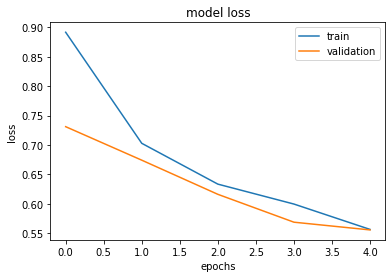

In [ ]:
# summarize history for loss
plt.plot(train_loss_acc.history['loss'])
plt.plot(train_loss_acc.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

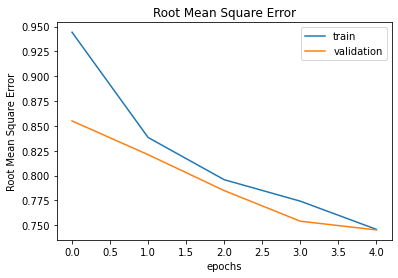

In [ ]:
# summarize history for our choosen metric
plt.plot(train_loss_acc.history['root_mean_squared_error'])
plt.plot(train_loss_acc.history['val_root_mean_squared_error'])
plt.title('Root Mean Square Error')
plt.ylabel('Root Mean Square Error')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
# Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

# Visualization of predictions

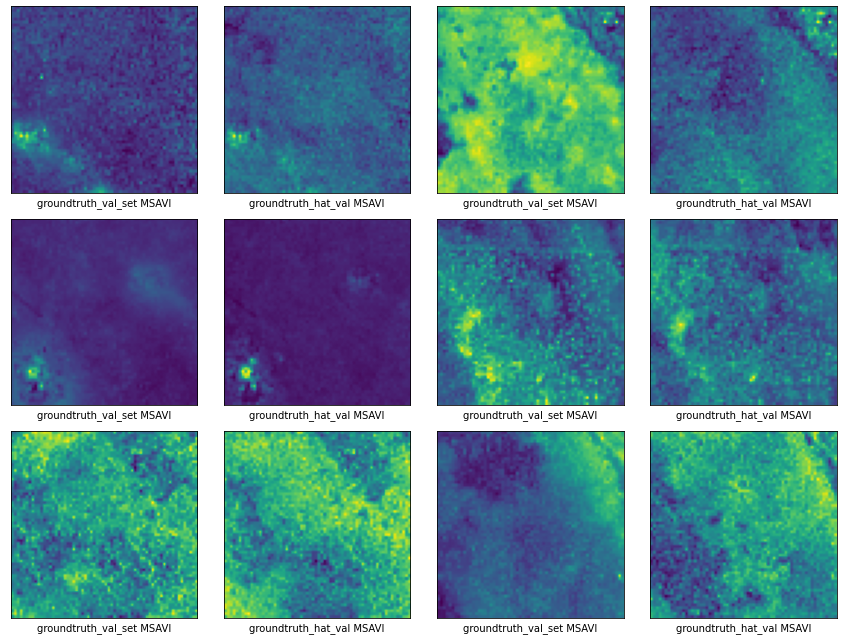

In [ ]:
# visualize the result for MSAVI for validation set for Skip CNN
plt.figure(figsize = (12, 9))
for i in range(1, 7):
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[i,:,:,0,4])
    plt.xlabel("groundtruth_val_set MSAVI")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[i,:,:,0,4])
    plt.xlabel("groundtruth_hat_val MSAVI")
plt.tight_layout();

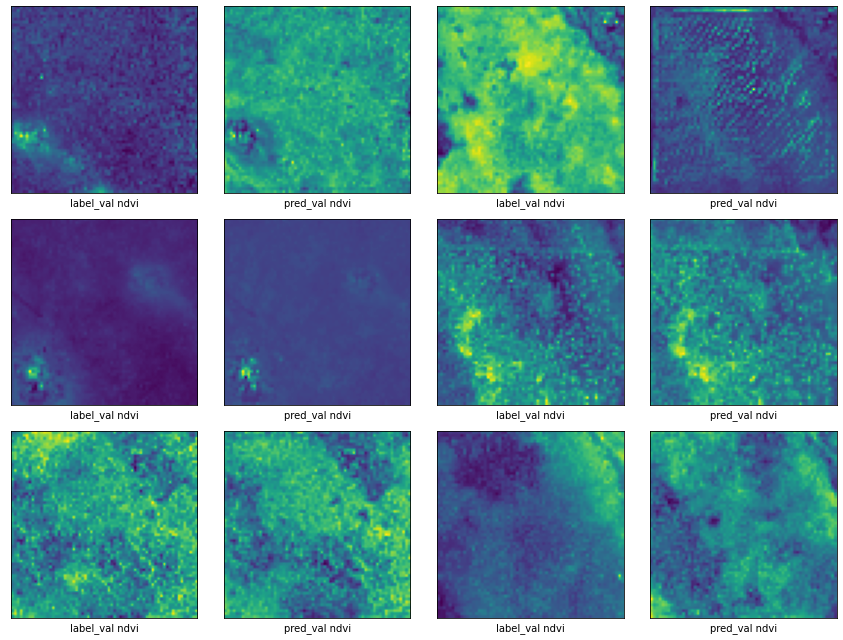

In [ ]:
# visualize the result for MSAVI for validation set for Skip ConvLSTM
plt.figure(figsize = (12, 9))
for i in range(1, 7):
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[i,0,:,:,3])
    plt.xlabel("label_val ndvi")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[i,0,:,:,3])
    plt.xlabel("pred_val ndvi")
plt.tight_layout();

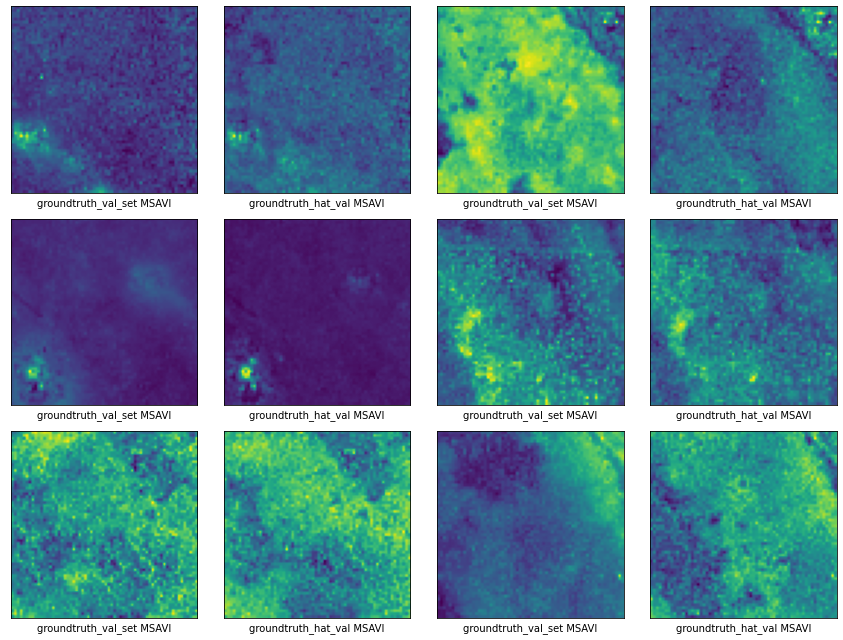

In [ ]:
# visualize the result for MSAVI for validation set for Resnet
plt.figure(figsize = (12, 9))
for i in range(1, 7):
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[i,:,:,0,4])
    plt.xlabel("groundtruth_val_set MSAVI")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[i,:,:,0,4])
    plt.xlabel("groundtruth_hat_val MSAVI")
plt.tight_layout();

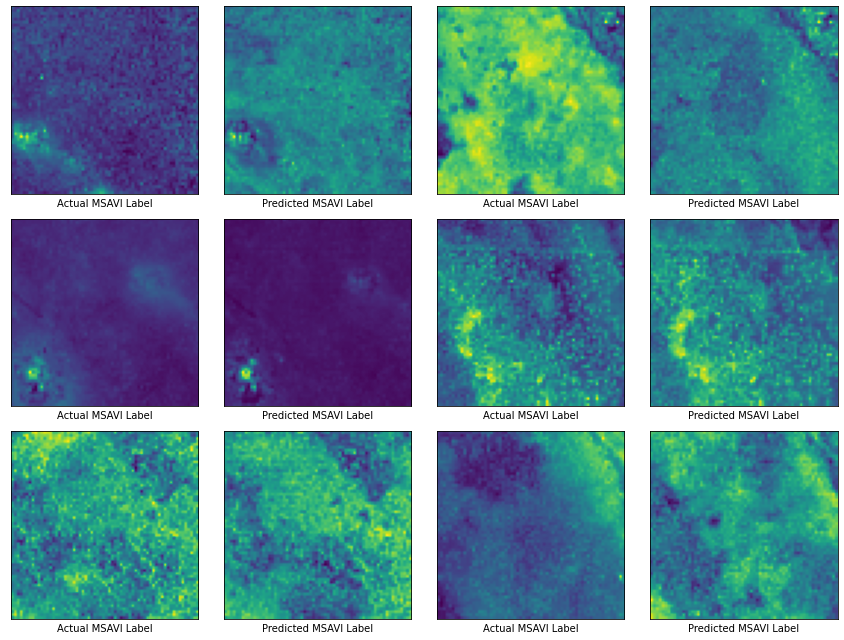

In [ ]:
# visualize the result for MSAVI for validation set for resnet(ConvLSTM)
plt.figure(figsize = (12, 9))
for i in range(1, 7):
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[i,0,:,:,4])
    plt.xlabel("Actual MSAVI Label")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[i,0,:,:,4])
    plt.xlabel("Predicted MSAVI Label")
plt.tight_layout();

# L1 loss

In [ ]:
# Calculating Mean L1 loss between the actual and the predicted labels for MSAVI for Skip CNN
l1_error = []
for q in range(label_val_set.shape[0]):
  squared_diff_image = tf.math.abs(label_val_set[q,:,:,0,4] - label_hat_val[q,:,:,0,4])  
  l1_error.append(squared_diff_image) # for l1 error

print(l1_error)
mean_l1_error = []
for a in range(label_val_set.shape[0]):
  avg_image = np.mean(l1_error[a])
  mean_l1_error.append(avg_image)

print(len(mean_l1_error))
print(mean_l1_error)



[<tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.61083776, 0.49446598, 0.4455989 , ..., 0.56048065, 0.57191145,
        0.59499997],
       [0.18566948, 0.26463455, 0.37001693, ..., 0.61890197, 0.6690438 ,
        0.6223476 ],
       [0.11230887, 0.4717713 , 0.33119893, ..., 0.5294747 , 0.7355598 ,
        0.6578939 ],
       ...,
       [0.5368946 , 0.53490376, 0.36236873, ..., 0.6438826 , 0.65520686,
        0.6178417 ],
       [0.5357489 , 0.6695279 , 0.60790265, ..., 0.6407896 , 0.551899  ,
        0.6170459 ],
       [0.4758518 , 0.5816166 , 0.5190143 , ..., 0.56086755, 0.5589774 ,
        0.6251881 ]], dtype=float32)>, <tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.37542045, 0.61405736, 0.6916625 , ..., 0.7748335 , 0.8623818 ,
        0.68828064],
       [0.57228595, 0.6019956 , 0.21976934, ..., 0.6156301 , 0.70236665,
        0.54398257],
       [0.4968596 , 0.4500257 , 0.52535975, ..., 0.8145326 , 0.904769  ,
        0.62999654],
       ...,
       [0.9

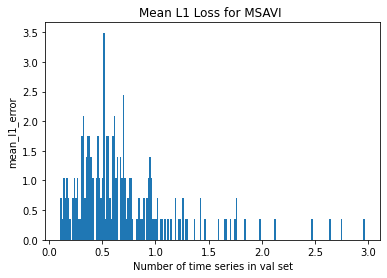

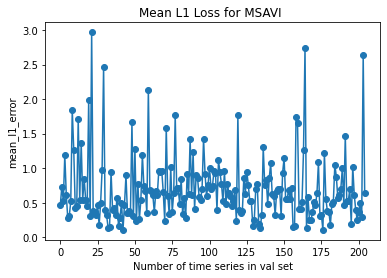

In [ ]:
# Ploting the Mean L1 loss for Skip CNN
plt.hist(mean_l1_error, density=True, bins=205)  # density=False would make counts
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for MSAVI ')
plt.show()

plt.plot(mean_l1_error,'o-')
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for MSAVI ')
plt.show()


In [ ]:
# Calculating Mean L1 loss between the actual and the predicted labels for MSAVI for convLSTM
l1_error = []
for q in range(label_val_set.shape[0]):
  squared_diff_image = tf.math.abs(label_val_set[q,0,:,:,4] - label_hat_val[q,0,:,:,4])  
  l1_error.append(squared_diff_image) # for l1 error

print(l1_error)
mean_l1_error = []
for a in range(label_val_set.shape[0]):
  avg_image = np.mean(l1_error[a])
  mean_l1_error.append(avg_image)

print(len(mean_l1_error))
print(mean_l1_error)

[<tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.6183563 , 0.50627834, 0.45507845, ..., 0.57932377, 0.5886354 ,
        0.60938567],
       [0.19563079, 0.2822082 , 0.386634  , ..., 0.6272956 , 0.68157625,
        0.63393974],
       [0.12189002, 0.48508215, 0.34797382, ..., 0.54115915, 0.74903595,
        0.66719204],
       ...,
       [0.5545488 , 0.5517605 , 0.3760192 , ..., 0.65851426, 0.6620083 ,
        0.62821615],
       [0.5512364 , 0.68000424, 0.6253022 , ..., 0.6565698 , 0.56352913,
        0.6240261 ],
       [0.49135497, 0.60259515, 0.5372997 , ..., 0.5750523 , 0.5798823 ,
        0.6312984 ]], dtype=float32)>, <tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.38257182, 0.62554413, 0.70085114, ..., 0.7922183 , 0.877957  ,
        0.70197475],
       [0.5826673 , 0.61913526, 0.23684429, ..., 0.6232984 , 0.7151338 ,
        0.5547559 ],
       [0.505844  , 0.46312788, 0.5421813 , ..., 0.8266818 , 0.91787964,
        0.6396589 ],
       ...,
       [0.9

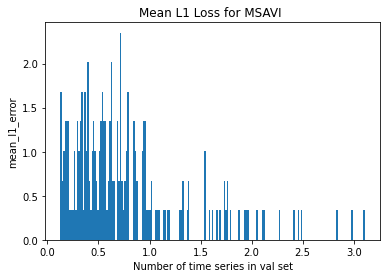

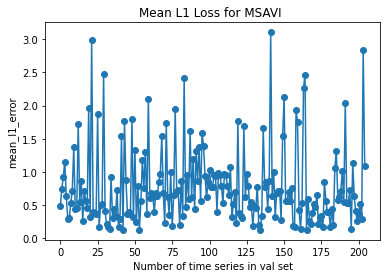

In [ ]:
# Ploting the Mean L1 loss for convLSTM
plt.hist(mean_l1_error, density=True, bins=205)  # density=False would make counts
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for MSAVI ')
plt.show()

plt.plot(mean_l1_error,'o-')
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for MSAVI ')
plt.show()


In [ ]:
# Calculating Mean L1 loss between the actual and the predicted labels for MSAVI for Resnet
l1_error = []
for q in range(label_val_set.shape[0]):
  squared_diff_image = tf.math.abs(label_val_set[q,:,:,0,4] - label_hat_val[q,:,:,0,4])  
  l1_error.append(squared_diff_image) # for l1 error

print(l1_error)
mean_l1_error = []
for a in range(label_val_set.shape[0]):
  avg_image = np.mean(l1_error[a])
  mean_l1_error.append(avg_image)

print(len(mean_l1_error))
print(mean_l1_error)

[<tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.6800224 , 0.5845268 , 0.4288654 , ..., 0.5933888 , 0.67983335,
        0.65788615],
       [0.2519313 , 0.26615584, 0.4393267 , ..., 0.75973105, 0.73645216,
        0.7061928 ],
       [0.12817916, 0.55841434, 0.42297775, ..., 0.5714743 , 0.81272227,
        0.7291627 ],
       ...,
       [0.51154685, 0.5567858 , 0.4615494 , ..., 0.6768038 , 0.7597595 ,
        0.7182918 ],
       [0.6146726 , 0.7257764 , 0.6142076 , ..., 0.74928904, 0.64838994,
        0.69173205],
       [0.5435845 , 0.62124735, 0.62373984, ..., 0.6215329 , 0.5999909 ,
        0.7921289 ]], dtype=float32)>, <tf.Tensor: shape=(64, 64), dtype=float32, numpy=
array([[0.4529963 , 0.7144509 , 0.67121524, ..., 0.81191117, 0.9815303 ,
        0.7574834 ],
       [0.64826435, 0.60174024, 0.2952857 , ..., 0.7747536 , 0.77743334,
        0.63616973],
       [0.51390404, 0.5473711 , 0.62527055, ..., 0.8622183 , 0.98911726,
        0.7100362 ],
       ...,
       [0.8

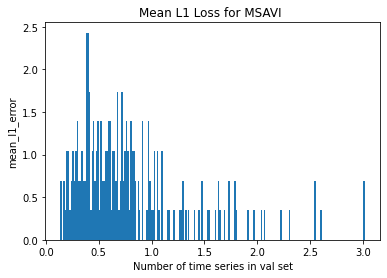

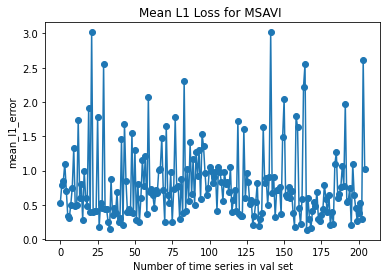

In [ ]:
# Ploting the Mean L1 loss for Resnet
plt.hist(mean_l1_error, density=True, bins=205)  # density=False would make counts
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for MSAVI ')
plt.show()

plt.plot(mean_l1_error,'o-')
plt.ylabel('mean_l1_error')
plt.xlabel('Number of time series in val set')
plt.title('Mean L1 Loss for MSAVI ')
plt.show()

# SSIM Loss

In [ ]:
# Calculating the range of pixel values in our training data
max_value = tf.math.reduce_max(train_set)
min_value = tf.math.reduce_min(train_set)
print(max_value)
print(min_value)
range = max_value - min_value
print(range)

tf.Tensor(36.8696, shape=(), dtype=float32)
tf.Tensor(-8.793588, shape=(), dtype=float32)
tf.Tensor(45.663185, shape=(), dtype=float32)


In [ ]:
# Calculating SSIM loss between the actual and the predicted labels for MSAVI for Skip CNN
ssim_loss = []
what = np.arange(205)
for q in what:
  img1 = label_val_set[q,:,:,0,4]
  img2 = label_hat_val[q,:,:,0,4]
  exp_true = tf.expand_dims(img1, axis = 0)
  exp_pred = tf.expand_dims(img2, axis = 0)
  exp_true_32 = tf.image.convert_image_dtype(exp_true, tf.float32)
  exp_pred_32 = tf.image.convert_image_dtype(exp_pred, tf.float32)
  ssim = tf.image.ssim(exp_true_32, exp_pred_32, filter_size=1, max_val = 47)
  ssim_loss.append(ssim)

print(ssim_loss)


[<tf.Tensor: shape=(), dtype=float32, numpy=0.48104146>, <tf.Tensor: shape=(), dtype=float32, numpy=0.28512865>, <tf.Tensor: shape=(), dtype=float32, numpy=0.65659857>, <tf.Tensor: shape=(), dtype=float32, numpy=-0.11530448>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4764262>, <tf.Tensor: shape=(), dtype=float32, numpy=0.776597>, <tf.Tensor: shape=(), dtype=float32, numpy=0.7189219>, <tf.Tensor: shape=(), dtype=float32, numpy=0.71081126>, <tf.Tensor: shape=(), dtype=float32, numpy=-0.3179983>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4009785>, <tf.Tensor: shape=(), dtype=float32, numpy=0.6016744>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5235394>, <tf.Tensor: shape=(), dtype=float32, numpy=-0.09933138>, <tf.Tensor: shape=(), dtype=float32, numpy=0.32964134>, <tf.Tensor: shape=(), dtype=float32, numpy=0.41123867>, <tf.Tensor: shape=(), dtype=float32, numpy=0.37490243>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5464691>, <tf.Tensor: shape=(), dtype=float32, numpy=0.3178382>

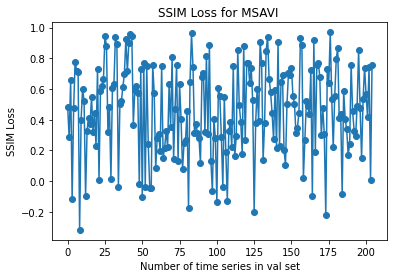

In [ ]:
# Ploting the SSIM Loss for Skip CNN

plt.plot(ssim_loss,'o-')
plt.ylabel('SSIM Loss')
plt.xlabel('Number of time series in val set')
plt.title('SSIM Loss for MSAVI ')
plt.show()



In [ ]:
# Calculating SSIM loss between the actual and the predicted labels for MSAVI for convLSTM
ssim_loss = []
what = np.arange(205)
for q in what:
  img1 = label_val_set[q,0,:,:,4]
  img2 = label_hat_val[q,0,:,:,4]
  exp_true = tf.expand_dims(img1, axis = 0)
  exp_pred = tf.expand_dims(img2, axis = 0)
  exp_true_32 = tf.image.convert_image_dtype(exp_true, tf.float32)
  exp_pred_32 = tf.image.convert_image_dtype(exp_pred, tf.float32)
  ssim = tf.image.ssim(exp_true_32, exp_pred_32, filter_size=1, max_val = 47)
  ssim_loss.append(ssim)

print(ssim_loss)


[<tf.Tensor: shape=(), dtype=float32, numpy=0.4554085>, <tf.Tensor: shape=(), dtype=float32, numpy=0.25669676>, <tf.Tensor: shape=(), dtype=float32, numpy=0.008644391>, <tf.Tensor: shape=(), dtype=float32, numpy=-0.06260255>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4434207>, <tf.Tensor: shape=(), dtype=float32, numpy=0.75014865>, <tf.Tensor: shape=(), dtype=float32, numpy=0.7218118>, <tf.Tensor: shape=(), dtype=float32, numpy=0.6951911>, <tf.Tensor: shape=(), dtype=float32, numpy=0.45732135>, <tf.Tensor: shape=(), dtype=float32, numpy=0.2707145>, <tf.Tensor: shape=(), dtype=float32, numpy=0.5737673>, <tf.Tensor: shape=(), dtype=float32, numpy=0.49378744>, <tf.Tensor: shape=(), dtype=float32, numpy=-0.11697526>, <tf.Tensor: shape=(), dtype=float32, numpy=0.304488>, <tf.Tensor: shape=(), dtype=float32, numpy=0.18557714>, <tf.Tensor: shape=(), dtype=float32, numpy=0.8427417>, <tf.Tensor: shape=(), dtype=float32, numpy=0.66311705>, <tf.Tensor: shape=(), dtype=float32, numpy=0.28193823

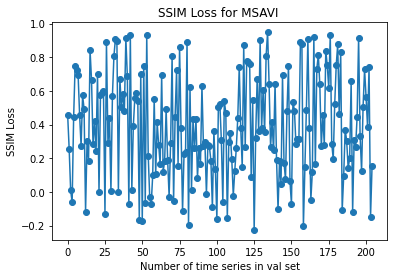

In [ ]:
# Ploting the SSIM Loss for convLSTM

plt.plot(ssim_loss,'o-')
plt.ylabel('SSIM Loss')
plt.xlabel('Number of time series in val set')
plt.title('SSIM Loss for MSAVI ')
plt.show()


In [ ]:
# Calculating SSIM loss between the actual and the predicted labels for MSAVI for Resnet
ssim_loss = []
what = np.arange(205)
for q in what:
  img1 = label_val_set[q,:,:,0,4]
  img2 = label_hat_val[q,:,:,0,4]
  exp_true = tf.expand_dims(img1, axis = 0)
  exp_pred = tf.expand_dims(img2, axis = 0)
  exp_true_32 = tf.image.convert_image_dtype(exp_true, tf.float32)
  exp_pred_32 = tf.image.convert_image_dtype(exp_pred, tf.float32)
  ssim = tf.image.ssim(exp_true_32, exp_pred_32, filter_size=1, max_val = 47)
  ssim_loss.append(ssim)

print(ssim_loss)

[<tf.Tensor: shape=(), dtype=float32, numpy=0.3765791>, <tf.Tensor: shape=(), dtype=float32, numpy=0.15755987>, <tf.Tensor: shape=(), dtype=float32, numpy=0.15029046>, <tf.Tensor: shape=(), dtype=float32, numpy=0.021232424>, <tf.Tensor: shape=(), dtype=float32, numpy=0.31047466>, <tf.Tensor: shape=(), dtype=float32, numpy=0.67911136>, <tf.Tensor: shape=(), dtype=float32, numpy=0.70883334>, <tf.Tensor: shape=(), dtype=float32, numpy=0.73308927>, <tf.Tensor: shape=(), dtype=float32, numpy=0.40663046>, <tf.Tensor: shape=(), dtype=float32, numpy=0.32731745>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4948308>, <tf.Tensor: shape=(), dtype=float32, numpy=0.4338264>, <tf.Tensor: shape=(), dtype=float32, numpy=-0.12593043>, <tf.Tensor: shape=(), dtype=float32, numpy=0.22595386>, <tf.Tensor: shape=(), dtype=float32, numpy=0.28845966>, <tf.Tensor: shape=(), dtype=float32, numpy=0.8141799>, <tf.Tensor: shape=(), dtype=float32, numpy=0.328343>, <tf.Tensor: shape=(), dtype=float32, numpy=0.202967

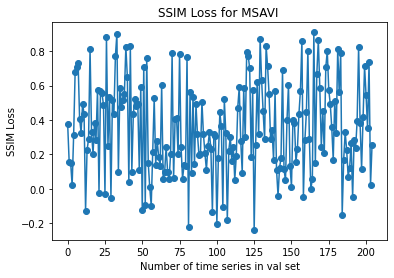

In [ ]:
# Ploting the SSIM Loss for Resnet

plt.plot(ssim_loss,'o-')
plt.ylabel('SSIM Loss')
plt.xlabel('Number of time series in val set')
plt.title('SSIM Loss for MSAVI ')
plt.show()

# Visualization of top results

In [ ]:
top = tf.math.top_k(
    ssim_loss, k=6, sorted=True, name=None
)

In [ ]:
top

TopKV2(values=<tf.Tensor: shape=(6,), dtype=float32, numpy=
array([0.9697775 , 0.9616734 , 0.9575286 , 0.9453021 , 0.94501233,
       0.9419115 ], dtype=float32)>, indices=<tf.Tensor: shape=(6,), dtype=int32, numpy=array([176,  83,  42,  25,  43, 134], dtype=int32)>)

In [ ]:
top.indices[0]

<tf.Tensor: shape=(), dtype=int32, numpy=176>

In [ ]:
print(tf.sort(
    mean_l1_error, direction='ASCENDING', name=None
))

tf.Tensor(
[0.10515948 0.10569682 0.12852858 0.13667561 0.13840955 0.14242786
 0.14866349 0.16025984 0.16329846 0.1673277  0.16958487 0.17685342
 0.18717961 0.19150253 0.2278612  0.22837621 0.24096106 0.24408224
 0.24462698 0.25073498 0.25374982 0.26392397 0.27069062 0.27135694
 0.2773829  0.292626   0.30191043 0.30618763 0.30633765 0.31042325
 0.3130061  0.3176871  0.31940278 0.3195383  0.32441634 0.32456118
 0.3270911  0.32905647 0.32918823 0.34387898 0.34618175 0.35527906
 0.3555386  0.35879105 0.36170444 0.36212927 0.3646974  0.36984038
 0.37057966 0.37245893 0.37501067 0.37674347 0.37950212 0.38960028
 0.39129764 0.39288887 0.39640534 0.39883205 0.40718192 0.41157496
 0.4151102  0.42025113 0.42303893 0.44498378 0.44690013 0.4537875
 0.46173137 0.46526295 0.4669396  0.467497   0.46797633 0.47795367
 0.47804105 0.47899956 0.4859465  0.48911935 0.49693108 0.5020405
 0.50651675 0.5118023  0.5156564  0.5181289  0.51875013 0.5207621
 0.52120936 0.52232933 0.5229198  0.52365017 0.5236751

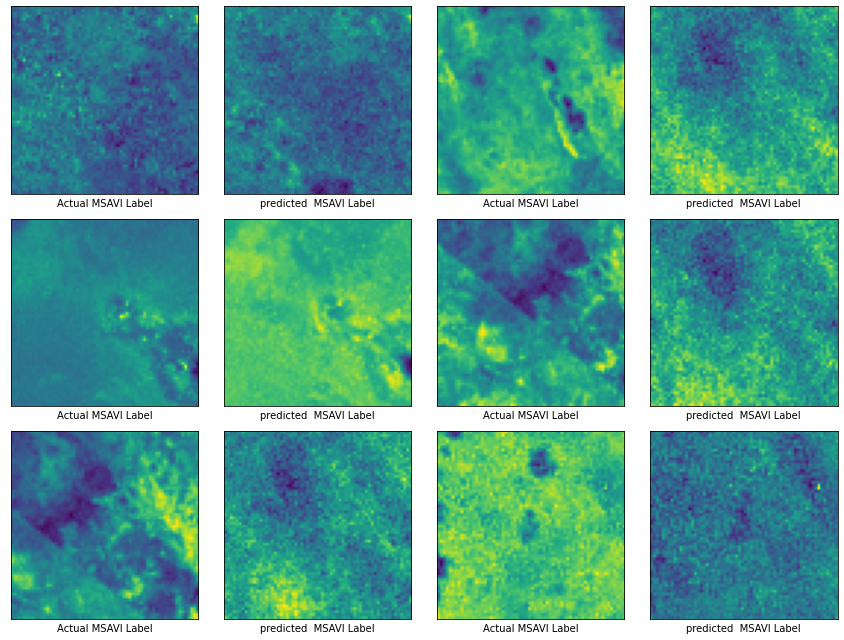

In [ ]:
#Plot the top 6 ssim predictions for Skip CNN
plt.figure(figsize = (12, 9))
what1 = np.arange(1, 7)
for i in what1:
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[top.indices[i-1],:,:,0,4])
    plt.xlabel("Actual MSAVI Label")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[top.indices[i-1],:,:,0,4])
    plt.xlabel("predicted  MSAVI Label")
plt.tight_layout();

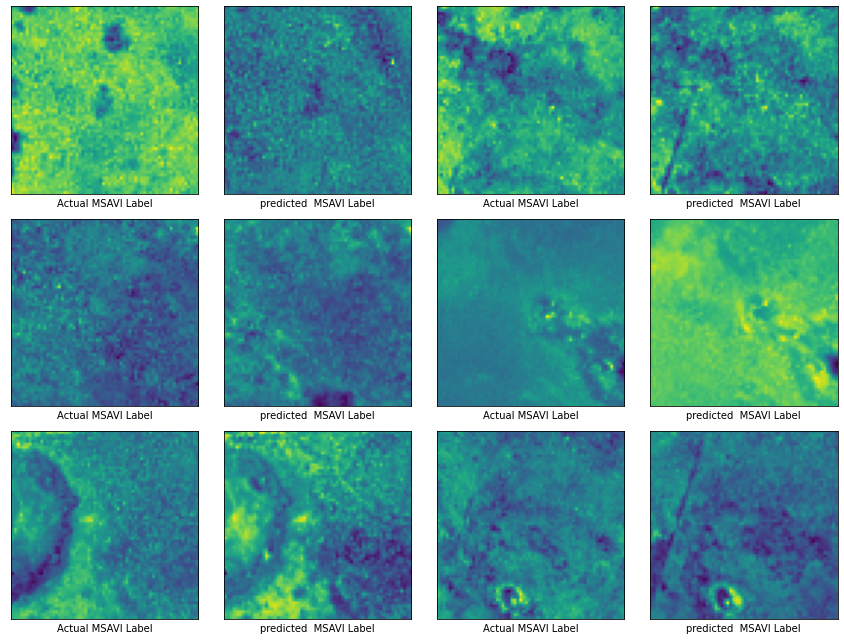

In [ ]:
#Plot the top 6 ssim predictions for Skip convLSTM
plt.figure(figsize = (12, 9))
what1 = np.arange(1, 7)
for i in what1:
    plt.subplot(3, 4, (i - 1) * 2 + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_val_set[top.indices[i-1],0,:,:,4])
    plt.xlabel("Actual MSAVI Label")
    plt.subplot(3, 4, (i - 1) * 2 + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(label_hat_val[top.indices[i-1],0,:,:,4])
    plt.xlabel("predicted  MSAVI Label")
plt.tight_layout();

Text(0.5, 0, 'groundtruth_hat_val MSAVI')

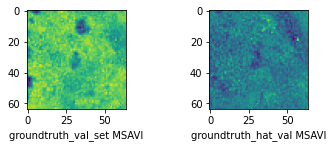

In [ ]:
# Genral Visualization code
fig = plt.figure()
ax1 = fig.add_subplot(2,2,1)
ax1.imshow(label_val_set[134,0,:,:,4])
plt.xlabel("groundtruth_val_set MSAVI")
ax2 = fig.add_subplot(2,2,2)
ax2.imshow(label_hat_val[134,0,:,:,4])
plt.xlabel("groundtruth_hat_val MSAVI")

In [ ]:
df = pd.DataFrame(ssim_loss, columns=['ssim_summary'])
df.describe()

,ssim_summary
count,205.000000
mean,0.450401
std,0.253641
min,-0.161308
25%,0.254153
50%,0.450747
75%,0.657074
max,0.947114


In [ ]:
print(df.loc[df['ssim_summary']>0.8].count())

ssim_summary    17
dtype: int64


# Resnet with CNN Layers


In [ ]:
# # Sample prediction model(Resnet)
inputs = keras.Input(shape=(64,64,24,6), name="input time series channels")
mean_input = K.mean(inputs, axis=3,  keepdims=True)
x = layers.Conv3D(32, 3, activation="PReLU", padding="same", kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(inputs)
x = layers.Conv3D(64, 3, activation="PReLU", padding="same")(x)
#x = layers.Conv3D(96, 3, activation="PReLU", padding="same")(x)
block_1_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)

x = layers.Conv3D(32, 3, activation="PReLU", padding="same")(block_1_output)
x = layers.Conv3D(64, 3, activation="PReLU", padding="same")(x)
#x = layers.Conv3D(96, 3, activation="PReLU", padding="same")(x)
x = layers.add([x, block_1_output])
block_2_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)

x = layers.Conv3D(32, 3, activation="PReLU", padding="same")(block_2_output)
x = layers.Conv3D(64, 3, activation="PReLU", padding="same")(x)
#x = layers.Conv3D(96, 3, activation="PReLU", padding="same")(x)
block_3_output = layers.add([x, block_2_output])

x = layers.Flatten()(block_3_output)
x = layers.Dropout(0.5)(x)
x = layers.Dense(1000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((64, 64, 1, 6))(x)
output = layers.add([x, mean_input])

model = keras.Model(inputs, output, name="SkipCNN")
model.summary()


Model: "SkipCNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 64, 64, 24,  0                                            
__________________________________________________________________________________________________
conv3d (Conv3D)                 (None, 64, 64, 24, 3 3150944     input time series channels[0][0] 
__________________________________________________________________________________________________
conv3d_1 (Conv3D)               (None, 64, 64, 24, 6 6346816     conv3d[0][0]                     
__________________________________________________________________________________________________
max_pooling3d (MaxPooling3D)    (None, 32, 32, 12, 6 0           conv3d_1[0][0]                   
____________________________________________________________________________________________

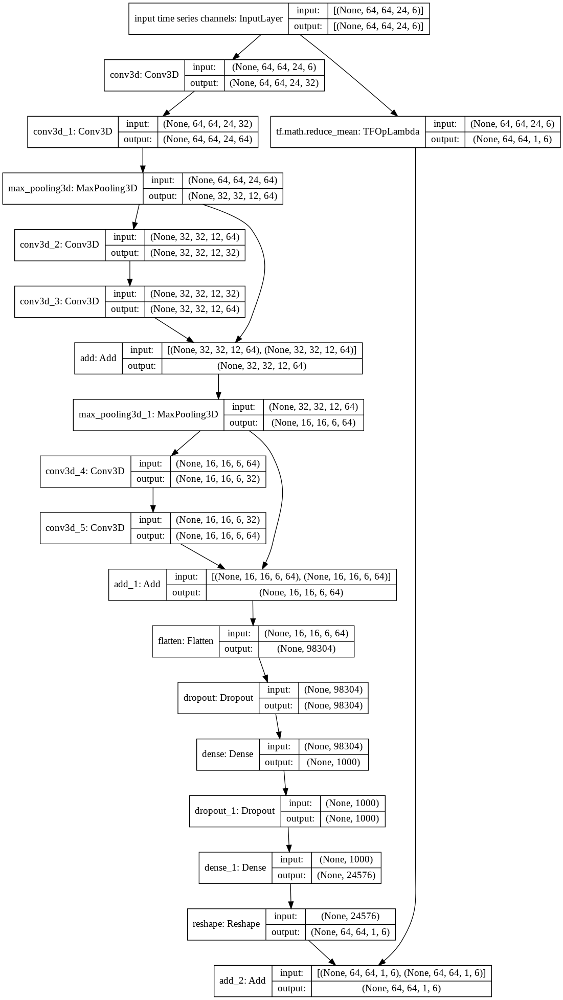

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
# Model Complilation 
model.compile(tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
    name='Adam'), loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
train_loss_acc = model.fit(train_set, label_train_set, epochs=4, validation_data=(val_set, label_val_set))

Epoch 1/4
23/23 [==============================] - 18s 588ms/step - loss: 4.2794 - root_mean_squared_error: 2.0687 - val_loss: 1.0431 - val_root_mean_squared_error: 1.0213
Epoch 2/4
23/23 [==============================] - 12s 525ms/step - loss: 1.0653 - root_mean_squared_error: 1.0321 - val_loss: 1.0427 - val_root_mean_squared_error: 1.0211
Epoch 3/4
23/23 [==============================] - 12s 523ms/step - loss: 1.0638 - root_mean_squared_error: 1.0314 - val_loss: 1.0398 - val_root_mean_squared_error: 1.0197
Epoch 4/4
23/23 [==============================] - 12s 525ms/step - loss: 1.0616 - root_mean_squared_error: 1.0304 - val_loss: 1.0285 - val_root_mean_squared_error: 1.0142


In [ ]:
# Checking the keys of the dictionary generated after training
print(train_loss_acc.history.keys())

dict_keys(['loss', 'root_mean_squared_error', 'val_loss', 'val_root_mean_squared_error'])


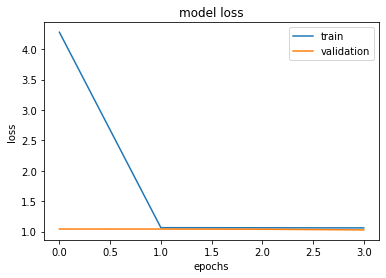

In [ ]:
# summarize history for loss
plt.plot(train_loss_acc.history['loss'])
plt.plot(train_loss_acc.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

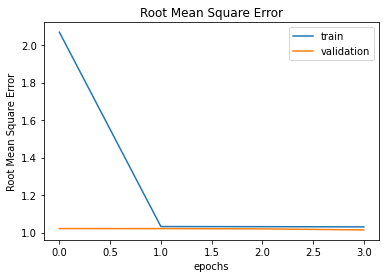

In [ ]:
# summarize history for our choosen metric
plt.plot(train_loss_acc.history['root_mean_squared_error'])
plt.plot(train_loss_acc.history['val_root_mean_squared_error'])
plt.title('Root Mean Square Error')
plt.ylabel('Root Mean Square Error')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
# Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

# Resnet with ConvLSTM layers

In [ ]:
# Moving axis in our initial data to bring time axis infront to work with convLSTMs
train_set = np.moveaxis(train_set,3,1)
print(train_set.shape)
label_train_set = np.moveaxis(label_train_set,3,1)
print(label_train_set.shape)
val_set = np.moveaxis(val_set,3,1)
print(val_set.shape)
label_val_set = np.moveaxis(label_val_set,3,1)
print(label_val_set.shape)

(716, 24, 64, 64, 6)
(716, 1, 64, 64, 6)
(205, 24, 64, 64, 6)
(205, 1, 64, 64, 6)


In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

In [ ]:
aug = np.empty((716,24,64,64,6), dtype= float)

In [ ]:

for i in range(716):
  img = train_set[i,:,:,:,:]
  #print(img.shape)
  for j in range(24):
    img1 = img[j,:,:,:]
    img2 = data_augmentation(img1)
    aug[i,j,:,:,:] = img2
    #print(img1.shape)  # Because data_augmentation requires a 3d input
    # for k in range(6):
    #   img2 = img1[:,:,k]
    #   img3 = data_augmentation(img2)
    #   aug[i,j,:,:,k] = img3
      
      

In [ ]:
print(aug.shape)

(716, 24, 64, 64, 6)


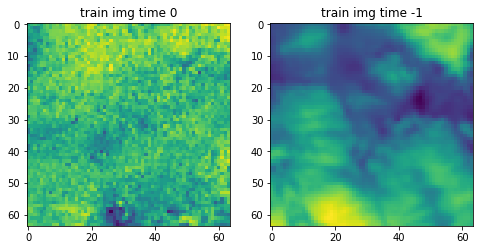

In [ ]:
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(aug[0,0,:,:,0])
ax1.set_title('train img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['label_data'][0,:,:,0,0])
# ax2.set_title('label img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(aug[0,1,:,:,0])
ax2.set_title('train img time -1')

plt.show()

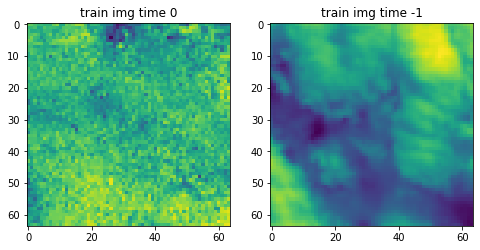

In [ ]:
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(train_set[0,0,:,:,0])
ax1.set_title('train img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['label_data'][0,:,:,0,0])
# ax2.set_title('label img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(train_set[0,1,:,:,0])
ax2.set_title('train img time -1')

plt.show()

In [ ]:
combine = tf.concat([train_set, aug], 0)

In [ ]:
print(combine.shape)

(1432, 24, 64, 64, 6)


In [ ]:
combin_label = tf.concat([label_train_set, label_train_set], 0)

In [ ]:
print(combin_label.shape)

(1432, 1, 64, 64, 6)


In [ ]:
# Initialize weights using gaussian
def gauss(x, sigma):
    return 1 / (np.sqrt(2 * np.pi) * sigma) * np.exp(-x**2 / (2 * sigma**2))
x = np.array([-3,-2,-1,0,1,2])
y = gauss(x, sigma=0.9)
weights = np.concatenate((y,y,y,y),axis=0)

In [ ]:
def time_WeightedMean(tensor):
  mean_tensor = tf.zeros_like(tensor[:,1,:,:,:], dtype='float32')
  for i in range(24):
    w_tensor = tf.ones_like(tensor[:,i,:,:,:], dtype='float32')*weights[i]
    mean_tensor = mean_tensor + tensor[:,i,:,:,:]*w_tensor

  mean_tensor = mean_tensor/(weights.sum())
  mean_tensor = tf.expand_dims(mean_tensor, axis = 1)
  return mean_tensor

In [ ]:
# # Sample prediction model(Resnet)
inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
#mean_input = K.mean(inputs, axis=1,  keepdims=True)
mean_input = Lambda(time_WeightedMean)(inputs)
x = layers.ConvLSTM2D(filters=16, kernel_size=(6, 6), padding="same", return_sequences=True, activation="PReLU")(inputs)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, activation="PReLU")(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=48, kernel_size=(1, 1), padding="same", return_sequences=True, activation="PReLU")(x)
block_1_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)

x = layers.ConvLSTM2D(filters=16, kernel_size=(6, 6), padding="same", return_sequences=True, activation="PReLU")(block_1_output)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, activation="PReLU")(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=48, kernel_size=(1, 1), padding="same", return_sequences=True, activation="PReLU")(x)
x = layers.add([x, block_1_output])
block_2_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)

x = layers.ConvLSTM2D(filters=16, kernel_size=(6, 6), padding="same", return_sequences=True, activation="PReLU")(block_2_output)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, activation="PReLU")(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=48, kernel_size=(1, 1), padding="same", return_sequences=True, activation="PReLU")(x)
block_3_output = layers.add([x, block_2_output])
print(K.int_shape(block_3_output))
x = layers.Flatten()(block_3_output)
x = layers.Dropout(0.5)(x)
x = layers.Dense(1000, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((64, 64, 1, 6))(x)
# x = layers.Conv3D(
#     filters=6, kernel_size=(8, 1, 1), activation="PReLU", padding="valid"
# )(block_3_output)
output = layers.add([x, mean_input])


model = keras.Model(inputs, output, name="ResnetConvLSTM")
model.summary()

(None, 6, 16, 16, 48)
Model: "ResnetConvLSTM"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 24, 64, 64,  0                                            
__________________________________________________________________________________________________
conv_lst_m2d (ConvLSTM2D)       (None, 24, 64, 64, 1 116288      input time series channels[0][0] 
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 24, 64, 64, 1 64          conv_lst_m2d[0][0]               
__________________________________________________________________________________________________
conv_lst_m2d_1 (ConvLSTM2D)     (None, 24, 64, 64, 3 186496      batch_normalization[0][0]        
_______________________________________________________________

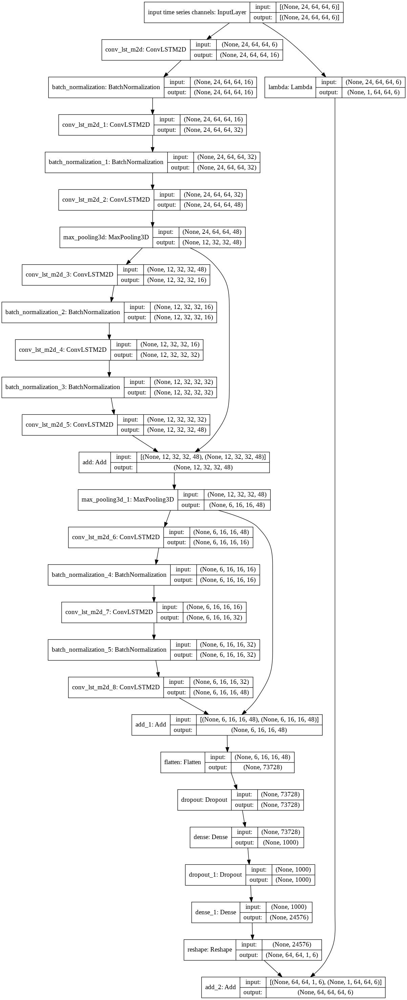

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
def custom_loss(y_true,y_pred):
  
    N = 1/(16*64*64*6)    # Normalization factor based on image dimensions (16,1,64,64,6)
    l1_loss = N*tf.reduce_sum(tf.abs(tf.math.subtract(y_true,y_pred)))
    l2_loss = N*tf.reduce_sum(tf.math.squared_difference(y_true,y_pred))
    ssim_loss = (1-tf.reduce_mean(tf.image.ssim(y_true,y_pred,max_val=37)))
    
    total_loss= 0.5*ssim_loss + 0.3*l1_loss + 0.2*l2_loss     # weighted sum of different losses
     
    return total_loss

In [ ]:
model.compile(
    loss= custom_loss, optimizer=keras.optimizers.Adam(),
)

In [ ]:
# Define some callbacks to improve training.
early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=5)

# Define modifiable training hyperparameters.
epochs = 4
batch_size = 8

# Fit the model to the training data.
model.fit(
    train_set,
    label_train_set,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(val_set, label_val_set),
    callbacks=[early_stopping, reduce_lr])

Epoch 1/4
12/90 [===>..........................] - ETA: 3:43 - loss: 15.4592

In [ ]:
  # Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

# Combination of CNN and convLSTM in resent setting

In [ ]:
# Moving axis in our initial data to bring time axis infront to work with convLSTMs
train_set = np.moveaxis(train_set,3,1)
print(train_set.shape)
label_train_set = np.moveaxis(label_train_set,3,1)
print(label_train_set.shape)
val_set = np.moveaxis(val_set,3,1)
print(val_set.shape)
label_val_set = np.moveaxis(label_val_set,3,1)
print(label_val_set.shape)

(716, 24, 64, 64, 6)
(716, 1, 64, 64, 6)
(205, 24, 64, 64, 6)
(205, 1, 64, 64, 6)


In [ ]:
inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
mean_input = K.mean(inputs, axis=1,  keepdims=True)
x = layers.ConvLSTM2D(filters=4, kernel_size=(6, 6), padding="same", return_sequences=True, activation="PReLU", kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(inputs)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=8, kernel_size=(6, 6), padding="same", return_sequences=True, activation="PReLU")(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=16, kernel_size=(6, 6), padding="same", return_sequences=True, activation="PReLU")(x)
block_1_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)


x = layers.Conv3D(4, 6, activation="PReLU", padding="same", kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(inputs)
x = layers.Conv3D(8, 6, activation="PReLU", padding="same")(x)
x = layers.Conv3D(16, 6, activation="PReLU", padding="same")(x)
block_2_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)

Combine_block_output  = layers.add([block_1_output, block_2_output])

x = layers.Flatten()(Combine_block_output)
x = layers.Dropout(0.5)(x)
x = layers.Dense(100, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((1, 64, 64, 6))(x)
output = layers.add([x, mean_input])

model = keras.Model(inputs, output, name="SkipCNN")
model.summary()


Model: "SkipCNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 24, 64, 64,  0                                            
__________________________________________________________________________________________________
conv_lst_m2d_24 (ConvLSTM2D)    (None, 24, 64, 64, 4 22160       input time series channels[0][0] 
__________________________________________________________________________________________________
batch_normalization_22 (BatchNo (None, 24, 64, 64, 4 16          conv_lst_m2d_24[0][0]            
__________________________________________________________________________________________________
conv_lst_m2d_25 (ConvLSTM2D)    (None, 24, 64, 64, 8 46624       batch_normalization_22[0][0]     
____________________________________________________________________________________________

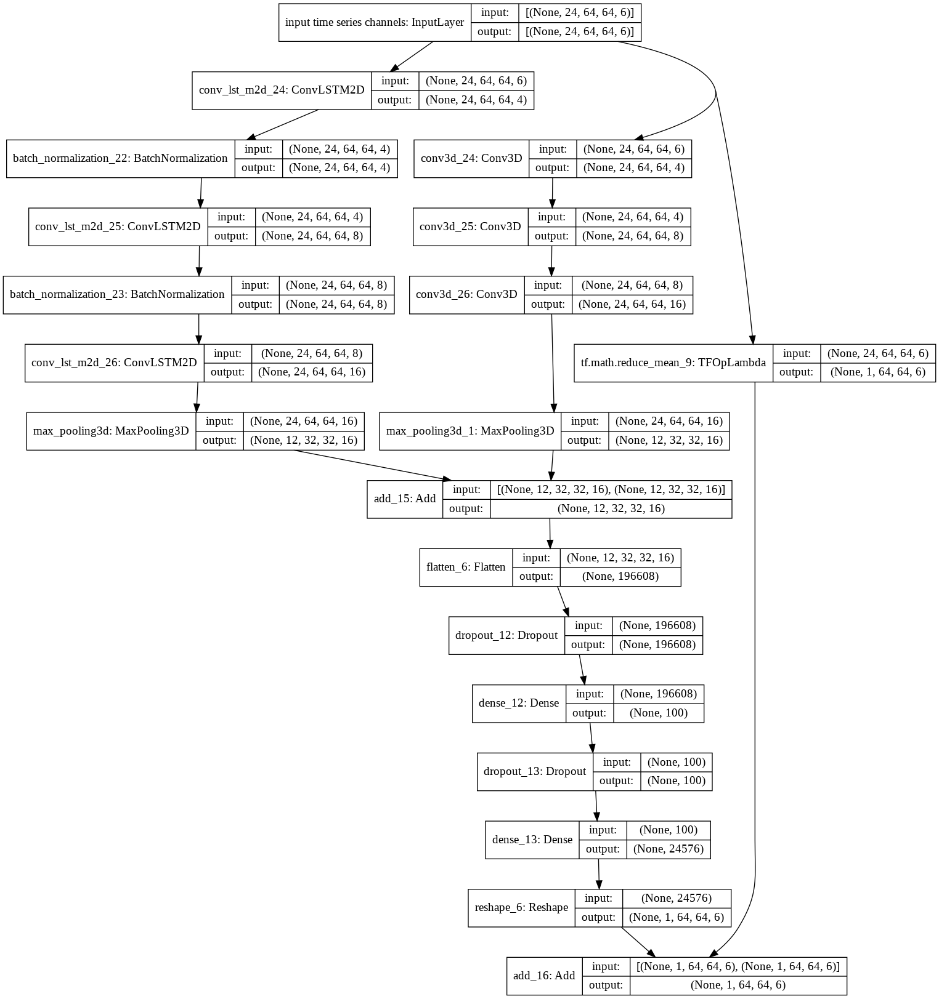

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
# Model Complilation 
model.compile(tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
    name='Adam'), loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
train_loss_acc = model.fit(train_set, label_train_set, epochs=4, validation_data=(val_set, label_val_set))

Epoch 1/4
 4/23 [====>.........................] - ETA: 45s - loss: 3.1737 - root_mean_squared_error: 1.7815

KeyboardInterrupt: ignored

In [ ]:
inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
mean_input = K.mean(inputs, axis=1,  keepdims=True)
x = layers.Conv3D(16, 3, activation="PReLU",padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(inputs)
x = layers.BatchNormalization()(x)
x = layers.Conv3D(32, 3, activation="PReLU",padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.Conv3D(48, 3, activation="PReLU",padding='same')(x)
print(K.int_shape(x))
block_1_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)
print(K.int_shape(block_1_output))




x = layers.ConvLSTM2D(filters=16, kernel_size=(3, 3), padding="same", return_sequences=True, activation="PReLU", kernel_initializer=tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(inputs)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, activation="PReLU")(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters=48, kernel_size=(3, 3), padding="same", return_sequences=True, activation="PReLU")(x)
print(K.int_shape(x))
block_2_output = layers.MaxPooling3D(pool_size=2,strides=2)(x)
print(K.int_shape(block_2_output))


Combine_block_output  = layers.add([block_1_output, block_2_output])

x = layers.Flatten()(Combine_block_output)
x = layers.Dropout(0.5)(x)
x = layers.Dense(100, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((1, 64, 64, 6))(x)
output = layers.add([x, mean_input])

model = keras.Model(inputs, output, name="SkipCNN")
model.summary()

(None, 24, 64, 64, 48)
(None, 12, 32, 32, 48)
(None, 24, 64, 64, 48)
(None, 12, 32, 32, 48)
Model: "SkipCNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 24, 64, 64,  0                                            
__________________________________________________________________________________________________
conv3d_3 (Conv3D)               (None, 24, 64, 64, 1 1575472     input time series channels[0][0] 
__________________________________________________________________________________________________
conv_lst_m2d_3 (ConvLSTM2D)     (None, 24, 64, 64, 1 78272       input time series channels[0][0] 
__________________________________________________________________________________________________
batch_normalization_4 (BatchNor (None, 24, 64, 64, 1 64          conv3d_3[0][0]                   


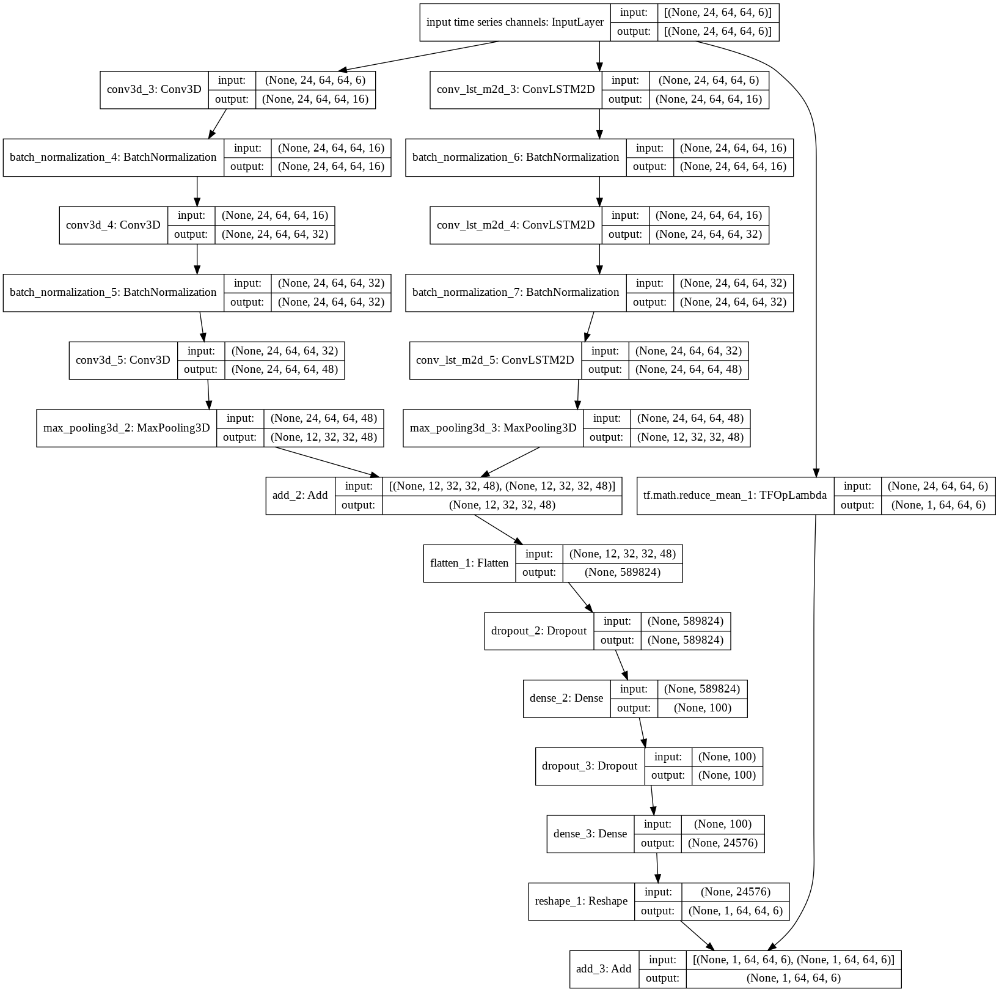

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
# Model Complilation 
model.compile(tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
    name='Adam'), loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
train_loss_acc = model.fit(train_set, label_train_set, epochs=4, validation_data=(val_set, label_val_set))

Epoch 1/4
23/23 [==============================] - 1067s 46s/step - loss: 1.0670 - root_mean_squared_error: 1.0330 - val_loss: 1.0430 - val_root_mean_squared_error: 1.0213
Epoch 2/4
23/23 [==============================] - 1159s 51s/step - loss: 1.0641 - root_mean_squared_error: 1.0316 - val_loss: 1.0427 - val_root_mean_squared_error: 1.0211
Epoch 3/4
23/23 [==============================] - 1192s 52s/step - loss: 1.0635 - root_mean_squared_error: 1.0312 - val_loss: 1.0395 - val_root_mean_squared_error: 1.0196
Epoch 4/4
11/23 [=============>................] - ETA: 10:00 - loss: 1.0574 - root_mean_squared_error: 1.0283

Wed Sep 22 15:44:23 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    34W / 250W |  15973MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


# Network Arch

In [ ]:
# Moving axis in our initial data to bring time axis infront to work with convLSTMs
train_set = np.moveaxis(train_set,3,1)
print(train_set.shape)
label_train_set = np.moveaxis(label_train_set,3,1)
print(label_train_set.shape)
val_set = np.moveaxis(val_set,3,1)
print(val_set.shape)
label_val_set = np.moveaxis(label_val_set,3,1)
print(label_val_set.shape)

(716, 24, 64, 64, 6)
(716, 1, 64, 64, 6)
(205, 24, 64, 64, 6)
(205, 1, 64, 64, 6)


In [ ]:
# recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
#                       kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.)
# recurrent_activation = "PReLU",
inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
mean_input = K.mean(inputs, axis=1,  keepdims=True)
# mean_input = Lambda(time_WeightedMean)(inputs)
x = layers.ConvLSTM2D(filters = 12, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout=0.5,
                      recurrent_dropout=0.5,
                      )(inputs)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters = 24, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout=0.5,
                      recurrent_dropout=0.5,)(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters = 32, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout=0.5,
                      recurrent_dropout=0.5,)(x)
print(K.int_shape(x))
block_1_output = x
# block_1_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(2, 2, 2), strides=(2, 2, 2), padding="valid")(x)
# print(K.int_shape(block_1_output))




y = layers.Conv3D(filters = 12, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(inputs)
y = layers.BatchNormalization()(y)
y = layers.Conv3D(filters = 24, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(y)
y = layers.BatchNormalization()(y)
y = layers.Conv3D(filters = 32, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(y)
print(K.int_shape(x))
block_2_output = layers.add([x, y])
# block_2_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(2, 2, 2), strides=(2, 2, 2), padding="valid")(x)
# print(K.int_shape(block_2_output))

m = layers.ConvLSTM2D(filters = 12, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout=0.5,
                      recurrent_dropout=0.5,
                      )(block_2_output)
m = layers.BatchNormalization()(m)
m = layers.ConvLSTM2D(filters = 24, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout=0.5,
                      recurrent_dropout=0.5,)(m)
m = layers.BatchNormalization()(m)
m = layers.ConvLSTM2D(filters = 32, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout=0.5,
                      recurrent_dropout=0.5,)(m)
print(K.int_shape(x))
block_3_output = layers.add([m, block_2_output])
# block_3_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(1, 1, 1), strides=(1, 1, 1), padding="valid")(x)
# print(K.int_shape(block_1_output))

n = layers.Conv3D(filters = 12, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(block_3_output)
n = layers.BatchNormalization()(n)
n = layers.Conv3D(filters = 24, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(n)
n = layers.BatchNormalization()(n)
n = layers.Conv3D(filters = 32, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(n)
print(K.int_shape(x))
block_4_output = layers.add([n, block_3_output])
block_4_output = tf.keras.layers.AveragePooling3D(
    pool_size=(2, 1, 1), strides=(2, 1, 1), padding="valid")(x)
print(K.int_shape(block_2_output))

# Combine_block_output  = layers.add([block_3_output, block_4_output])

x = layers.Flatten()(block_4_output)
x = layers.Dropout(0.5)(x)
x = layers.Dense(100, activation="PReLU")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(24576, activation="linear")(x)
x = layers.Reshape((1, 64, 64, 6))(x)
output = layers.add([x, mean_input])

model = keras.Model(inputs, output, name="Combination")
model.summary()

(None, 24, 64, 64, 32)
(None, 24, 64, 64, 32)
(None, 24, 64, 64, 32)
(None, 24, 64, 64, 32)
(None, 24, 64, 64, 32)
Model: "Combination"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 24, 64, 64,  0                                            
__________________________________________________________________________________________________
conv_lst_m2d_18 (ConvLSTM2D)    (None, 24, 64, 64, 1 56976       input time series channels[0][0] 
__________________________________________________________________________________________________
batch_normalization_22 (BatchNo (None, 24, 64, 64, 1 48          conv_lst_m2d_18[0][0]            
__________________________________________________________________________________________________
conv_lst_m2d_19 (ConvLSTM2D)    (None, 24, 64, 64, 2 129504      batch_n

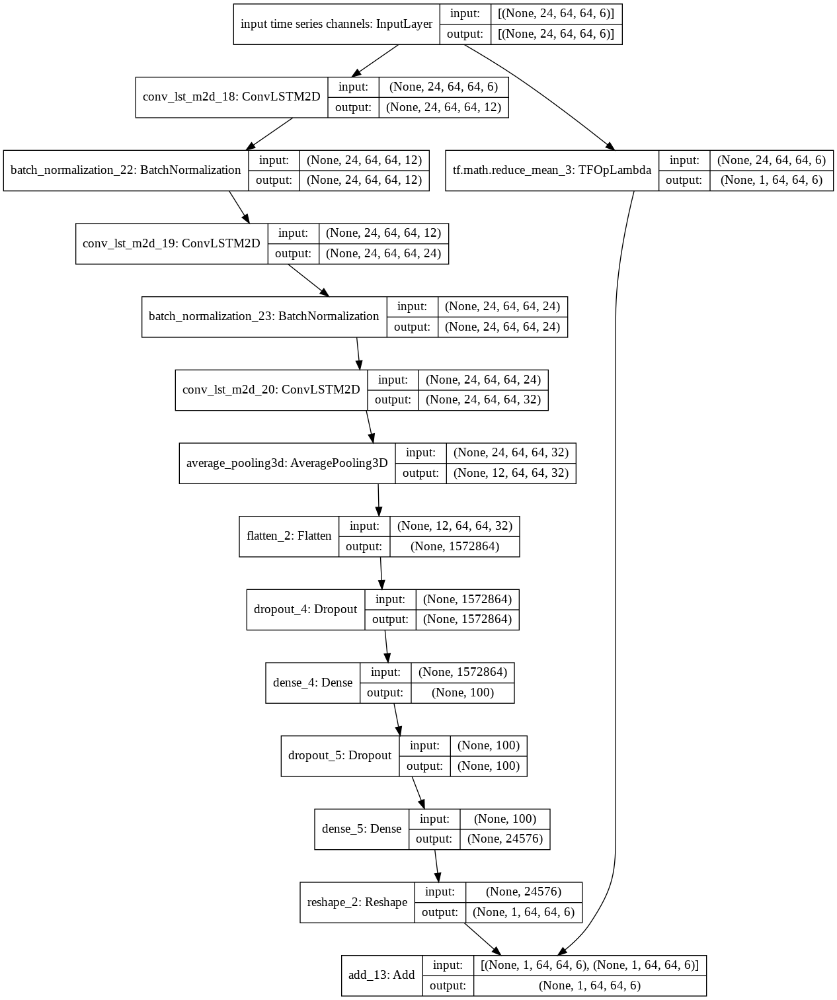

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
# Model Complilation 
model.compile(tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
     name='Adam'), loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
train_loss_acc = model.fit(train_set, label_train_set, epochs=6, batch_size=4, validation_data=(val_set, label_val_set))

Epoch 1/6
358/358 [==============================] - 173s 458ms/step - loss: 1.0345 - root_mean_squared_error: 1.0171 - val_loss: 1.0565 - val_root_mean_squared_error: 1.0278
Epoch 2/6
358/358 [==============================] - 162s 453ms/step - loss: 1.0344 - root_mean_squared_error: 1.0171 - val_loss: 1.0565 - val_root_mean_squared_error: 1.0279
Epoch 3/6
358/358 [==============================] - 162s 451ms/step - loss: 1.0343 - root_mean_squared_error: 1.0170 - val_loss: 1.0565 - val_root_mean_squared_error: 1.0279
Epoch 4/6
358/358 [==============================] - 159s 445ms/step - loss: 1.0343 - root_mean_squared_error: 1.0170 - val_loss: 1.0565 - val_root_mean_squared_error: 1.0279
Epoch 5/6
358/358 [==============================] - 159s 445ms/step - loss: 1.0342 - root_mean_squared_error: 1.0170 - val_loss: 1.0566 - val_root_mean_squared_error: 1.0279
Epoch 6/6
358/358 [==============================] - 159s 445ms/step - loss: 1.0342 - root_mean_squared_error: 1.0170 - val_l

In [ ]:

# Model-building function OR HyperModel subclass
#Building a function for a model(model for which hyper parameter needs to be tuned) in this case skip CNN model
def build_model(hp):
  inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
  x = inputs
  y = inputs
  #mean = time_mean(inputs)
  print(tf.keras.backend.is_keras_tensor(x))
  inputs_shape = K.int_shape(x)
  print(inputs_shape[0])
  print(inputs_shape)
  mean_input = K.mean(x, axis=3,  keepdims=True)
  #mean_input = Lambda(time_WeightedMean)(x)
  print(mean_input.shape)
  for i in range(hp.Int("conv_lstm_layers", 3, 5, default=3)):
    filters = hp.Int("filters_lstm" + str(i), 16, 90, step=16)
    kernel = hp.Int("kerel_lstm" + str(i), 3, 9, step=2)
    strides = hp.Int("strides_lstm" + str(i), 1, 5, step=1)
    dilation = hp.Int("dilation_lstm" + str(i), 1, 5, step=1)
    x = layers.ConvLSTM2D(filters, kernel_size = kernel, strides = strides, dilation_rate = dilation, 
                      padding = "same", return_sequences = True, activation = "PReLU", 
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      dropout = hp.Float("dropout", 0, 0.5, step=0.1, default=0.5),
                      recurrent_dropout = hp.Float("r_dropout", 0, 0.5, step=0.1, default=0.5),
                      )(x)
    x = layers.BatchNormalization()(x) 
  if hp.Choice("pooling_" + str(i), ["avg", "max"]) == "avg":
    block_1_output = tf.keras.layers.AveragePooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding="valid")(x)  
  else:
    block_1_output = tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding="valid")(x) 
                   
  # for i in range(hp.Int("conv_layers", 3, 5, default=3)):
  #   filters = hp.Int("filters_" + str(i), 16, 90, step=16)
  #   kernel = hp.Int("kerel_" + str(i), 3, 9, step=2)
  #   strides = hp.Int("strides_" + str(i), 1, 5, step=1)
  #   dilation = hp.Int("dilation_" + str(i), 1, 5, step=1)
  #   y = layers.Conv3D(filters, kernel_size = kernel, strides = strides, dilation_rate = dilation, 
  #                     padding = "same", activation = "PReLU", 
  #                     kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(y)
  #   y = layers.BatchNormalization()(y) 
  # if hp.Choice("pooling_" + str(i), ["avg", "max"]) == "avg":
  #   block_2_output = tf.keras.layers.AveragePooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding="valid")(y)  
  # else:
  #   block_2_output = tf.keras.layers.MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2), padding="valid")(y)
  
  
  x = layers.Flatten()(block_1_output)
  x = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(x)
  x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  x = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(x)
  x = layers.Dense(24576, activation="linear")(x)
  x = layers.Reshape((1, 64, 64, 6))(x)

  # y = layers.Flatten()(block_2_output)
  # y = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(y)
  # y = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(y)
  # y = layers.Dropout(hp.Float("dropout", 0, 0.5, step=0.1, default=0.5))(y)
  # y = layers.Dense(24576, activation="linear")(y)
  # y = layers.Reshape((1, 64, 64, 6))(y)
  
  output = layers.add([x, mean_input])
  model = keras.Model(inputs, output, name="combination")

  model.compile(
            optimizer=tf.keras.optimizers.Adam(
                hp.Float("learning_rate", 1e-5, 1e-2, sampling="log")), loss="mse", metrics=[tf.keras.metrics.RootMeanSquaredError()],)
  return model

In [ ]:
#Instantiate the tuner to be used [RandomSearch, Hyperband, or BayesianOptimization]
tuner = kt.BayesianOptimization(
        build_model,
        #objective = 'mse',
        #objective = 'root_mean_squared_error',
        objective = kt.Objective("root_mean_squared_error", direction="min"),
        max_trials = 10,
        seed=None,
        hyperparameters=None,
        tune_new_entries=True,
        allow_new_entries=True,
    )

INFO:tensorflow:Reloading Oracle from existing project ./untitled_project/oracle.json
True
None
(None, 24, 64, 64, 6)
(None, 24, 64, 1, 6)


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/keras_tuner/engine/hypermodel.py", line 127, in build
    model = self.hypermodel.build(hp)
  File "<ipython-input-27-2a1d82d6991c>", line 51, in build_model
    x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 977, in __call__
    input_list)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 1115, in _functional_construction_call
    inputs, input_masks, args, kwargs)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 848, in _keras_tensor_symbolic_call
    return self._infer_output_signature(inputs, args, kwargs, input_masks)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 886, in _infer_output_signature
    self._maybe_build(inputs)
  File "/usr/local/lib/python3.7/dist-packages/keras/en

Invalid model 0/5
True
None
(None, 24, 64, 64, 6)
(None, 24, 64, 1, 6)


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/keras_tuner/engine/hypermodel.py", line 127, in build
    model = self.hypermodel.build(hp)
  File "<ipython-input-27-2a1d82d6991c>", line 51, in build_model
    x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 977, in __call__
    input_list)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 1115, in _functional_construction_call
    inputs, input_masks, args, kwargs)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 848, in _keras_tensor_symbolic_call
    return self._infer_output_signature(inputs, args, kwargs, input_masks)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 886, in _infer_output_signature
    self._maybe_build(inputs)
  File "/usr/local/lib/python3.7/dist-packages/keras/en

Invalid model 1/5
True
None
(None, 24, 64, 64, 6)
(None, 24, 64, 1, 6)


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/keras_tuner/engine/hypermodel.py", line 127, in build
    model = self.hypermodel.build(hp)
  File "<ipython-input-27-2a1d82d6991c>", line 51, in build_model
    x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 977, in __call__
    input_list)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 1115, in _functional_construction_call
    inputs, input_masks, args, kwargs)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 848, in _keras_tensor_symbolic_call
    return self._infer_output_signature(inputs, args, kwargs, input_masks)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 886, in _infer_output_signature
    self._maybe_build(inputs)
  File "/usr/local/lib/python3.7/dist-packages/keras/en

Invalid model 2/5
True
None
(None, 24, 64, 64, 6)
(None, 24, 64, 1, 6)


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/keras_tuner/engine/hypermodel.py", line 127, in build
    model = self.hypermodel.build(hp)
  File "<ipython-input-27-2a1d82d6991c>", line 51, in build_model
    x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 977, in __call__
    input_list)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 1115, in _functional_construction_call
    inputs, input_masks, args, kwargs)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 848, in _keras_tensor_symbolic_call
    return self._infer_output_signature(inputs, args, kwargs, input_masks)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 886, in _infer_output_signature
    self._maybe_build(inputs)
  File "/usr/local/lib/python3.7/dist-packages/keras/en

Invalid model 3/5
True
None
(None, 24, 64, 64, 6)
(None, 24, 64, 1, 6)


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/keras_tuner/engine/hypermodel.py", line 127, in build
    model = self.hypermodel.build(hp)
  File "<ipython-input-27-2a1d82d6991c>", line 51, in build_model
    x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 977, in __call__
    input_list)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 1115, in _functional_construction_call
    inputs, input_masks, args, kwargs)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 848, in _keras_tensor_symbolic_call
    return self._infer_output_signature(inputs, args, kwargs, input_masks)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 886, in _infer_output_signature
    self._maybe_build(inputs)
  File "/usr/local/lib/python3.7/dist-packages/keras/en

Invalid model 4/5
True
None
(None, 24, 64, 64, 6)
(None, 24, 64, 1, 6)
Invalid model 5/5


Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/keras_tuner/engine/hypermodel.py", line 127, in build
    model = self.hypermodel.build(hp)
  File "<ipython-input-27-2a1d82d6991c>", line 51, in build_model
    x = layers.Dense(hp.Int("hidden_size", 0, 100, step=10, default=100), activation="PReLU")(x)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 977, in __call__
    input_list)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 1115, in _functional_construction_call
    inputs, input_masks, args, kwargs)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 848, in _keras_tensor_symbolic_call
    return self._infer_output_signature(inputs, args, kwargs, input_masks)
  File "/usr/local/lib/python3.7/dist-packages/keras/engine/base_layer.py", line 886, in _infer_output_signature
    self._maybe_build(inputs)
  File "/usr/local/lib/python3.7/dist-packages/keras/en

RuntimeError: ignored

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu Sep 23 18:05:40 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0    31W /  70W |  14060MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


# New Attempt 1

In [ ]:
inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
mean_input = K.mean(inputs, axis=1,  keepdims=True)
# mean_input = Lambda(time_WeightedMean)(inputs)
x = layers.ConvLSTM2D(filters = 16, kernel_size = (3, 3), strides = (1, 1), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.5,
                      recurrent_dropout=0.5,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.)
                      )(inputs)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters = 9, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.3,
                       recurrent_dropout=0.3,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      )(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters = 6, kernel_size = (3, 3), strides = (1, 1), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.5,
                      recurrent_dropout=0.5,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.)
                      )(x)
x = layers.BatchNormalization()(x)
print(K.int_shape(x))
x = layers.add([x, inputs])
# print(K.int_shape(x))
# block_1_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(2, 1, 1), strides=(2, 1, 1), padding="valid")(x)
# print(K.int_shape(block_1_output))



y = layers.Conv3D(filters = 16, kernel_size = (3, 3, 3), strides = (1, 1, 1), 
                  padding = "same", activation = "PReLU", 
                  kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(x)
y = layers.BatchNormalization()(y)
y = layers.Conv3D(filters = 9, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(y)
y = layers.BatchNormalization()(y)
y = layers.Conv3D(filters = 6, kernel_size = (3, 3, 3), strides = (1, 1, 1), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(y)
y = layers.BatchNormalization()(y)
print(K.int_shape(y))
y = layers.add([y, x, inputs])
# print(K.int_shape(y))
# block_2_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(2, 1, 1), strides=(2, 1, 1), padding="valid")(y)
# print(K.int_shape(block_2_output))


m = layers.ConvLSTM2D(filters = 16, kernel_size = (3, 3), strides = (1, 1), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.5,
                      recurrent_dropout=0.5,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.)
                      )(y)
m = layers.BatchNormalization()(m)
m = layers.ConvLSTM2D(filters = 9, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.3,
                       recurrent_dropout=0.3,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      )(m)
m = layers.BatchNormalization()(m)
m = layers.ConvLSTM2D(filters = 6, kernel_size = (3, 3), strides = (1, 1), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.5,
                      recurrent_dropout=0.5,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.)
                      )(m)
m = layers.BatchNormalization()(m)
print(K.int_shape(m))
m = layers.add([m, y, x, inputs])
# print(K.int_shape(m))
# block_3_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(2, 1, 1), strides=(2, 1, 1), padding="valid")(m)
# print(K.int_shape(block_3_output))

n = layers.Conv3D(filters = 16, kernel_size = (3, 3, 3), strides = (1, 1, 1), 
                  padding = "same", activation = "PReLU", 
                  kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(m)
n = layers.BatchNormalization()(n)
n = layers.Conv3D(filters = 9, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(n)
n = layers.BatchNormalization()(n)
n = layers.Conv3D(filters = 6, kernel_size = (3, 3, 3), strides = (1, 1, 1), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(n)
n = layers.BatchNormalization()(n)
print(K.int_shape(n))
n = layers.add([n, m, x, y, inputs])
# print(K.int_shape(n))
# block_4_output = tf.keras.layers.AveragePooling3D(
#     pool_size=(2, 1, 1), strides=(2, 1, 1), padding="valid")(n)
# print(K.int_shape(block_4_output))


# Combine_block_output  = layers.add([block_1_output, block_2_output, block_3_output, block_4_output])


Combine_block_output  = layers.add([x, y, m, n])
print(K.int_shape(Combine_block_output))

# z = layers.Flatten()(Combine_block_output)
# z = layers.Dropout(0.3)(z)
# z = layers.Dense(500, activation="PReLU")(z)
# z = layers.Dropout(0.3)(z)
# z = layers.Dense(24576, activation="linear")(z)
# z = layers.Reshape((1, 64, 64, 6))(z)
# output = layers.add([z, mean_input])


z = layers.Conv3D(filters = 6, kernel_size = (3, 3, 3), strides = (6, 1, 1), 
                      padding = "same", activation = "PReLU")(Combine_block_output)
print(K.int_shape(z))    
z = layers.Dropout(0.5)(z)                 
z = layers.Conv3D(filters = 6, kernel_size = (3, 3, 3), strides = (4, 1, 1), 
                      padding = "same", activation = "PReLU", 
                      )(z)
print(K.int_shape(z))
z = layers.Dropout(0.5)(z) 
z = layers.Conv3D(filters = 6, kernel_size = (3, 3, 3), strides = (2, 1, 1), 
                      padding = "same", activation = "PReLU", 
                      )(z)
print(K.int_shape(z)) 
z = layers.Dropout(0.5)(z)                      
z = layers.Conv3D(filters = 6, kernel_size = (3, 3, 3), strides = (3, 1, 1), 
                      padding = "same", activation = "PReLU", 
                      )(z)
print(K.int_shape(z))
output = layers.add([z, mean_input])
print(K.int_shape(z))
model = keras.Model(inputs, output, name="Combination")
model.summary()

(None, 24, 64, 64, 6)
(None, 24, 64, 64, 6)
(None, 24, 64, 64, 6)
(None, 24, 64, 64, 6)
(None, 24, 64, 64, 6)
(None, 4, 64, 64, 6)
(None, 1, 64, 64, 6)
(None, 1, 64, 64, 6)
(None, 1, 64, 64, 6)
(None, 1, 64, 64, 6)
Model: "Combination"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input time series channels (Inp [(None, 24, 64, 64,  0                                            
__________________________________________________________________________________________________
conv_lst_m2d (ConvLSTM2D)       (None, 24, 64, 64, 1 78272       input time series channels[0][0] 
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 24, 64, 64, 1 64          conv_lst_m2d[0][0]               
_______________________________________________________________________

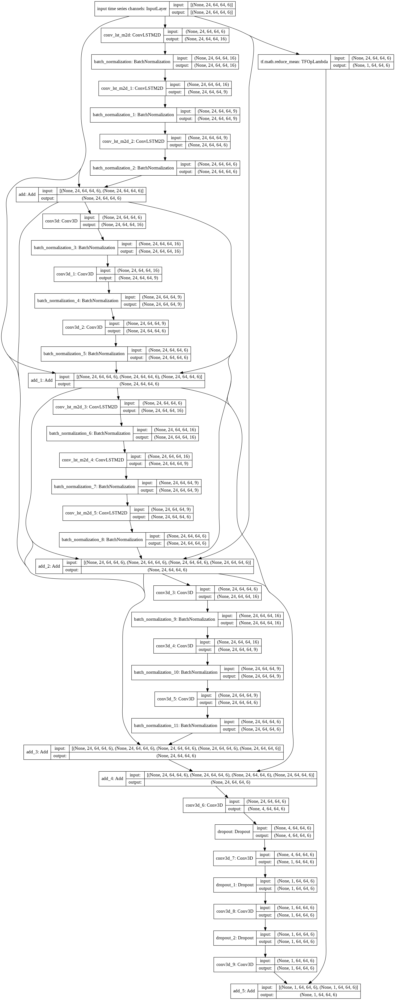

In [ ]:
# Model Graph
keras.utils.plot_model(model, "SkipCNN.png", show_shapes=True)

In [ ]:
# Model Complilation 
model.compile(tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
     name='Adam'), loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
train_loss_acc = model.fit(train_set, label_train_set, epochs=10, batch_size=12, validation_data=(val_set, label_val_set))

Epoch 1/10
120/120 [==============================] - 237s 2s/step - loss: 4.0532 - root_mean_squared_error: 2.0132 - val_loss: 1.0886 - val_root_mean_squared_error: 1.0434
Epoch 2/10
120/120 [==============================] - 208s 2s/step - loss: 1.7027 - root_mean_squared_error: 1.3049 - val_loss: 1.0651 - val_root_mean_squared_error: 1.0320
Epoch 3/10
120/120 [==============================] - 208s 2s/step - loss: 1.3496 - root_mean_squared_error: 1.1617 - val_loss: 1.0607 - val_root_mean_squared_error: 1.0299
Epoch 4/10
120/120 [==============================] - 210s 2s/step - loss: 1.2199 - root_mean_squared_error: 1.1045 - val_loss: 1.0588 - val_root_mean_squared_error: 1.0290
Epoch 5/10
120/120 [==============================] - 209s 2s/step - loss: 1.1559 - root_mean_squared_error: 1.0751 - val_loss: 1.0579 - val_root_mean_squared_error: 1.0286
Epoch 6/10
106/120 [=========================>....] - ETA: 23s - loss: 1.1405 - root_mean_squared_error: 1.0679

KeyboardInterrupt: ignored

In [ ]:
# Checking the keys of the dictionary generated after training
print(train_loss_acc.history.keys())

dict_keys(['loss', 'root_mean_squared_error', 'val_loss', 'val_root_mean_squared_error'])


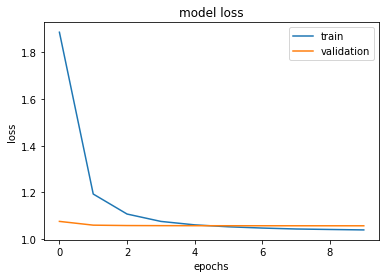

In [ ]:
# summarize history for loss
plt.plot(train_loss_acc.history['loss'])
plt.plot(train_loss_acc.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

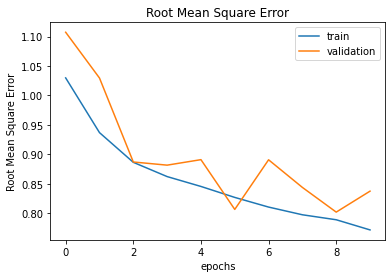

In [ ]:
# summarize history for our choosen metric
plt.plot(train_loss_acc.history['root_mean_squared_error'])
plt.plot(train_loss_acc.history['val_root_mean_squared_error'])
plt.title('Root Mean Square Error')
plt.ylabel('Root Mean Square Error')
plt.xlabel('epochs')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [ ]:
# Lets start by predicting Label for val_set
label_hat_val = model.predict(val_set)

# New Attempt 2

In [ ]:
inputs = keras.Input(shape=(24,64,64,6), name="input time series channels")
mean_input = K.mean(inputs, axis=1,  keepdims=True)
x = layers.ConvLSTM2D(filters = 6, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.3,
                       recurrent_dropout=0.3,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      
                      )(inputs)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(filters = 12, kernel_size = (3, 3), strides = (1, 1), dilation_rate = (2, 2), 
                      padding = "same", return_sequences = True, activation = "PReLU", dropout=0.2,
                       recurrent_dropout=0.2,
                      recurrent_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.),
                      )(x)
x = layers.BatchNormalization()(x)
x = layers.Conv3D(filters = 9, kernel_size = (3, 3, 3), strides = (1, 1, 1), dilation_rate = (2, 2, 2), 
                      padding = "same", activation = "PReLU", 
                      kernel_initializer = tf.keras.initializers.RandomNormal(mean=0., stddev=1.))(x)

# Data Augumentation

In [ ]:
# Moving axis in our initial data to bring time axis infront to work with convLSTMs
train_set = np.moveaxis(train_set,3,1)
print(train_set.shape)
label_train_set = np.moveaxis(label_train_set,3,1)
print(label_train_set.shape)
val_set = np.moveaxis(val_set,3,1)
print(val_set.shape)
label_val_set = np.moveaxis(label_val_set,3,1)
print(label_val_set.shape)

(716, 24, 64, 64, 6)
(716, 1, 64, 64, 6)
(205, 24, 64, 64, 6)
(205, 1, 64, 64, 6)


In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

In [ ]:
aug = np.empty((716,24,64,64,6), dtype= float)

In [ ]:

for i in range(716):
  img = train_set[i,:,:,:,:]
  #print(img.shape)
  for j in range(24):
    img1 = img[j,:,:,:]
    img2 = data_augmentation(img1)
    aug[i,j,:,:,:] = img2
    #print(img1.shape)  # Because data_augmentation requires a 3d input
    # for k in range(6):
    #   img2 = img1[:,:,k]
    #   img3 = data_augmentation(img2)
    #   aug[i,j,:,:,k] = img3
      
      

In [ ]:
print(aug.shape)

(716, 24, 64, 64, 6)


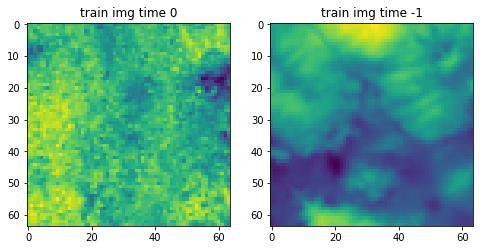

In [ ]:
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(aug[0,0,:,:,0])
ax1.set_title('train img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['label_data'][0,:,:,0,0])
# ax2.set_title('label img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(aug[0,1,:,:,0])
ax2.set_title('train img time -1')

plt.show()

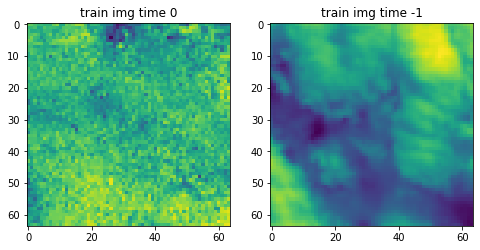

In [ ]:
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(train_set[0,0,:,:,0])
ax1.set_title('train img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['label_data'][0,:,:,0,0])
# ax2.set_title('label img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(train_set[0,1,:,:,0])
ax2.set_title('train img time -1')

plt.show()

In [ ]:
train_set = tf.concat([train_set, aug], 0)

In [ ]:
print(train_set.shape)

(1432, 24, 64, 64, 6)


In [ ]:
label_train_set = tf.concat([label_train_set, label_train_set], 0)

In [ ]:
print(label_train_set.shape)

(1432, 1, 64, 64, 6)


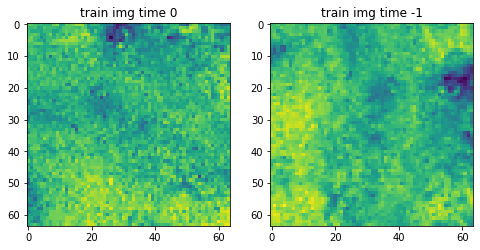

In [ ]:
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(train_set[0,0,:,:,0])
ax1.set_title('train img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['label_data'][0,:,:,0,0])
# ax2.set_title('label img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(train_set[716,0,:,:,0])
ax2.set_title('train img time -1')

plt.show()

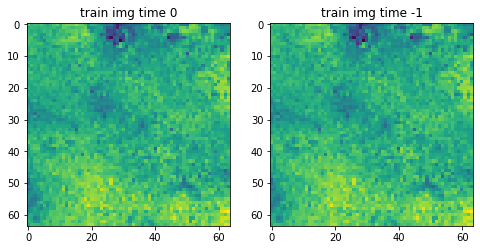

In [ ]:
plt.figure(figsize = (8, 8))
ax1 = plt.subplot(1,2,1)
ax1.imshow(label_train_set[0,0,:,:,0])
ax1.set_title('train img time 0')

# ax2 = plt.subplot(1,2,2)
# ax2.imshow(f['label_data'][0,:,:,0,0])
# ax2.set_title('label img time 0')

ax2 = plt.subplot(1,2,2)
ax2.imshow(label_train_set[716,0,:,:,0])
ax2.set_title('train img time -1')

plt.show()